<a href="https://colab.research.google.com/github/Tapomay1/Netflix-Movies-and-TV-Shows/blob/main/Netflix_Movies_and_TV_Shows_Clustering_Unsupervised_Learning_Capstone_Group.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name** - **Netflix Movies and TV Shows Clustering**

#####**Project Type** - Unsupervised Learning
#####**Contribution** - Team
##### **Team Member - 1** - Tapomay Sahoo
##### **Team Member - 2** - Shivam Tiwari

#**Project Summary**

Hello, all. We have worked on the Netflix Movies and TV Shows dataset provided by a third party until the year of 2019. The dataset contains information of the various TV Shows, Movies, Documentaries and many more content on the streaming service provider's website.

Title, Cast, Director, Country of Production and Description are some of the things available for each content on the streaming website.

We have tried to work on the data and get three things out of it:

a. We have tried to generate insights through the EDA process

b. We have tried to analyse the change in Netflix's operations

c. And most importantly, we have tried to build a machine learning clustering model that helps us segregate the contents based on similarity in various features.

We hope that you like the project and we would like to listen to your thoughts on it. You can reach us at er.tapomay@gmail.com and shivchirag1997@gmail.com

#**Github Link**

The official github link of the project is https://github.com/Tapomay1/Netflix-Movies-and-TV-Shows

# **Problem Statement**


**BUSINESS OVERVIEW**

Netflix is a very popular online streaming service provider offering a variety of TV shows, movies, documentaries and lots more to watch. We have the dataset containing the list of their TV shows, movies and the other content that they have on their platform. The list is procured from a third party website and contains information until 2021.

We are supposed to offer insights from the dataset on Netflix and its content. We are also supposed to cluster the contents based on text features.

# ***Let's Begin !*** 

## ***1. Know Your Data***

####Import Libraries

In [2]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt, matplotlib.dates as mdates
import matplotlib.patches as mpatches
import seaborn as sns
sns.set()
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.options.display.float_format = '{:.2f}'.format
import scipy.stats
from statsmodels.stats.weightstats import ztest as ztest
from sklearn.preprocessing import MinMaxScaler
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
import string
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from wordcloud import WordCloud, STOPWORDS

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


####Dataset Loading

In [3]:
# Importing the data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Loading the data
dataset = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Module_04/Unsupervised_3/csv/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

In [5]:
# Generating a copy
df = dataset.copy()

####Dataset Overview

In [6]:
# First view of the dataset
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [7]:
# No. of rows and columns
df.shape

(7787, 12)

In [8]:
# Dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


####Duplicate and Null Values

In [9]:
# Duplicates in the dataset
len(df[df.duplicated()])

0

In [9]:
# Missing Values
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


#### What do we know now about the dataset?

From the first looks, the dataset looks like it will need some cleaning. Apart from the missing values, we have also encountered some discripencies in the values for some of the columns after going through the GSheet.

We have 7787 datapoints and 12 columns. Most of the variables are text data. Only release year is numeric, but it is also discrete in nature.

## ***2. Understanding the variables***

In [10]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [11]:
# Dataset Describe
df.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.00,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.93,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.76,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.00,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.00,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.00,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.00,NaN,NaN,NaN,NaN


####Variables Description

**show_id :** Unique ID for every TV show/movie

**type :** Movie or a TV Show

**title :** Title of the content

**director :** Director of the content

**cast :** Star cast of the content

**country :** Country of production

**date_added :** Date the content was added on Netflix

**release_year :** Release year of the content

**rating :** TV Rating of the content

**duration :** No. of mins (how long) in case of movies and No. of seasons in case of TV shows

**listed_in :** Genre of the content

**description :** Summary description for the content

####Checking number of unique values

In [12]:
# Check unique values for each variable.
for i in df.columns.tolist():
  print("No. of unique values in ",i,"is",df[i].nunique(),".")

No. of unique values in  show_id is 7787 .
No. of unique values in  type is 2 .
No. of unique values in  title is 7787 .
No. of unique values in  director is 4049 .
No. of unique values in  cast is 6831 .
No. of unique values in  country is 681 .
No. of unique values in  date_added is 1565 .
No. of unique values in  release_year is 73 .
No. of unique values in  rating is 14 .
No. of unique values in  duration is 216 .
No. of unique values in  listed_in is 492 .
No. of unique values in  description is 7769 .


## ***3. Data Wrangling***

In [13]:
# Converting the Date column to datetime datatype
df.date_added = pd.to_datetime(df.date_added,dayfirst=True)

In [14]:
# Creating columns for month, year and day of the week when the contents were added
df['month_added'] = pd.DatetimeIndex(df.date_added).month
df['day_of_week_added'] = pd.DatetimeIndex(df.date_added).dayofweek
df['year_added'] = pd.DatetimeIndex(df.date_added).year
df['day_of_month_added'] = pd.DatetimeIndex(df.date_added).day

In [15]:
df['date_month_added'] = df['date_added'].dt.strftime('%d-%m %H:%M:%S')

In [16]:
# Segregating the dataset based on content type
tv_df = df[df.type=='TV Show']
movies_df = df[df.type=='Movie']

We have segregated the dataset based on the content type. We have also made the date_added column's datatype datetime. And then we extracted the month, year and day of the week as individual columns from the main column.

## ***4. Understanding the relationships between variables using different kinds of visualisation techniques:***


####4.1 How many TV shows and how many movies?

In [17]:
pie_data = df.type.value_counts(normalize=True).reset_index()
pie_data

,index,type
0,Movie,0.69
1,TV Show,0.31


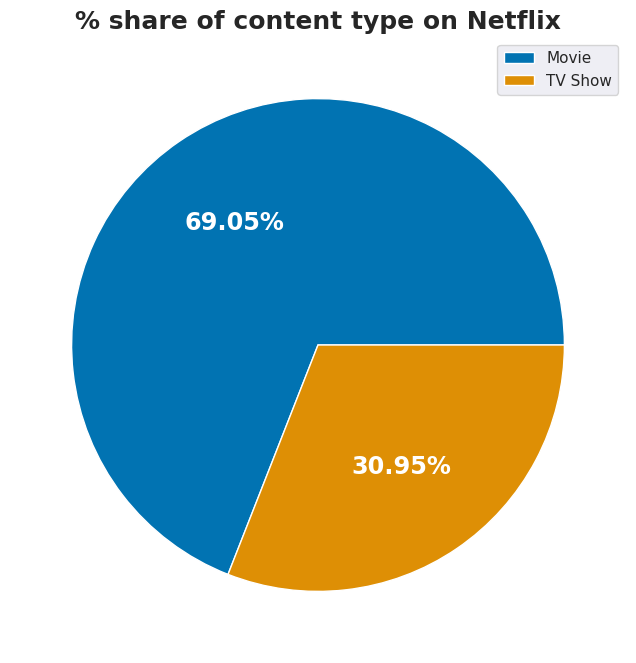

In [18]:
# Plotting the graph
sns.set_palette("colorblind")
plt.figure(figsize=(12,8))
plt.pie(pie_data['type'],
        labels = pie_data['index'].values,
        autopct = "%.2f%%", # % values in 2 decimals
        textprops = {"size":"x-large",
                     "fontweight":"bold",
                     "color":"w"}) # styling the text
plt.legend()
# Giving our chart a suitable title
plt.title("% share of content type on Netflix", fontweight = "bold", fontsize = 18)
plt.show();

**Observation:**

There are more than double the amount of Movies than TV Shows on Netflix. Movies account for 69.05% whereas TV Shows account for 30.95% of the dataset.

####4.2 Which are the top 20 dates when the contents are added?

In [19]:
# Preparing the dataset
bar_data = df.groupby('date_month_added').agg({'date_month_added':'count'}).rename(columns={'date_month_added':'count'}).reset_index().sort_values(by='count', ascending=False).head(20)
bar_data['date_month_added'] = bar_data['date_month_added'].astype('str')
new = bar_data['date_month_added'].str.split(' ', expand=True)
bar_data['date_month_added'] = new[0]
bar_data.head()

,date_month_added,count
0,01-01,320
9,01-10,257
10,01-11,244
6,01-07,179
3,01-04,156


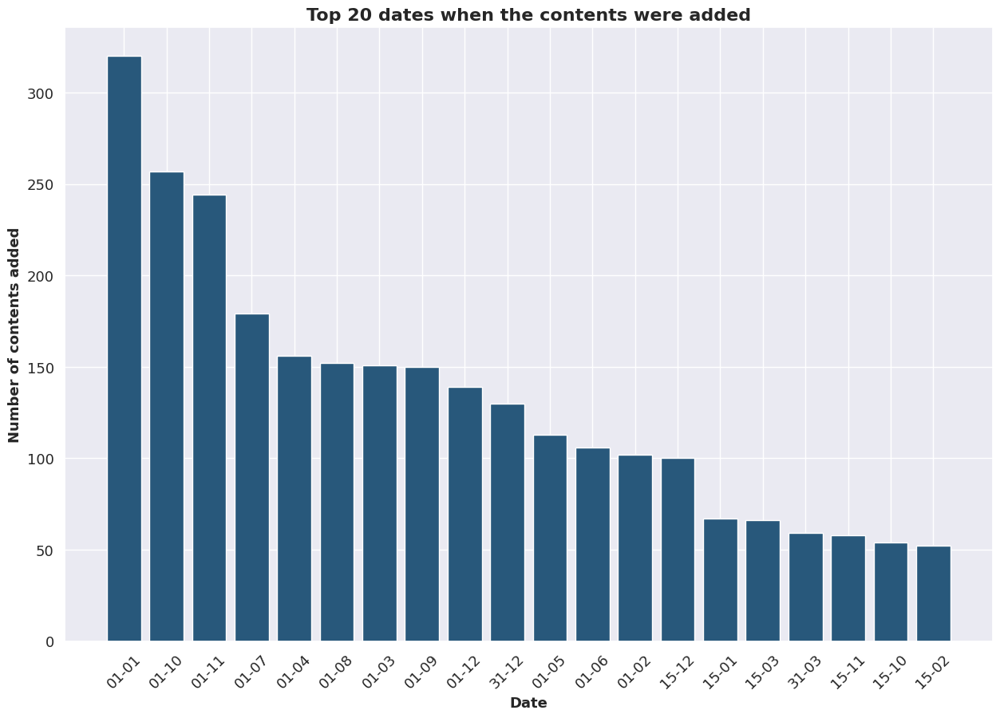

In [20]:
# Plotting the graph
plt.figure(figsize = (15,10))
plt.bar(x = bar_data['date_month_added'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 45)
plt.yticks(fontsize = 13)
plt.title('Top 20 dates when the contents were added', fontsize = 16, fontweight = 'bold')
plt.xlabel('Date', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents added', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

If we look at the distribution of the dates when the contents were added, the second half of a year (the holiday period) is usually when they add the content and it is either on the 1st or the 15th or the 31st.

####4.3 Distribution of the content's country of production

In [21]:
# Preparing the dataset
# Overall country count
country_df = df.country.str.split(', ', expand=True).stack().reset_index().rename(columns={'level_0':'index','level_1':'nth country',0:'country'})
country_df = country_df.country.value_counts().reset_index().rename(columns={'index':'country','country':'total'})
# Country count for movies
movies_country_df = movies_df.country.str.split(', ', expand=True).stack().reset_index().rename(columns={'level_0':'index','level_1':'nth country',0:'country'})
movies_country_df = movies_country_df.country.value_counts().reset_index().rename(columns={'index':'country','country':'total_movies'})
# Country count for TV Shows
tv_country_df = tv_df.country.str.split(', ', expand=True).stack().reset_index().rename(columns={'level_0':'index','level_1':'nth country',0:'country'})
tv_country_df = tv_country_df.country.value_counts().reset_index().rename(columns={'index':'country','country':'total_TV'})
# Merging the datsets
country_df = country_df.merge(movies_country_df, on='country')
country_df = country_df.merge(tv_country_df, on='country')
country_df.head()

,country,total,total_movies,total_TV
0,United States,3296,2430,866
1,India,990,915,75
2,United Kingdom,722,466,256
3,Canada,412,286,126
4,France,349,265,84


In [22]:
# Selecting the dataset
bar_data = country_df.head(10)
bar_data

,country,total,total_movies,total_TV
0,United States,3296,2430,866
1,India,990,915,75
2,United Kingdom,722,466,256
3,Canada,412,286,126
4,France,349,265,84
5,Japan,287,103,184
6,Spain,215,158,57
7,South Korea,212,55,157
8,Germany,199,157,42
9,Mexico,154,101,53


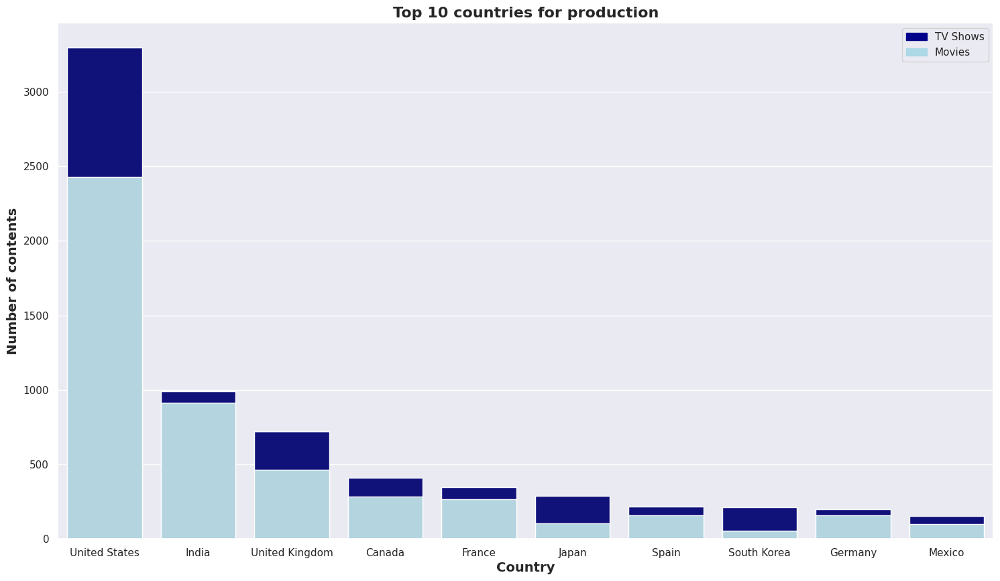

In [23]:
# Creating the plot
sns.set(style="darkgrid")
plt.figure(figsize=(18,10))
bar1 = sns.barplot(x="country",  y="total", data=bar_data, color='darkblue')
bar2 = sns.barplot(x="country",  y="total_movies", data=bar_data, ci=None, color='lightblue')
# add legend
top_bar = mpatches.Patch(color='darkblue', label='TV Shows')
bottom_bar = mpatches.Patch(color='lightblue', label='Movies')
plt.legend(handles=[top_bar, bottom_bar])
plt.xlabel('Country', fontsize = 14, weight = "bold")
plt.ylabel('Number of contents', fontsize = 14, weight = "bold")
plt.title('Top 10 countries for production', fontsize = 16, weight = "bold")
# show the graph
plt.show();

**Observation:**

United States has the highest number of contents produced and it is three times in numbers when compared with the next best in line, India.

Countries generally focus a lot on movies, but there are exceptions. East Asian countries like Japan and South Korea produce more TV Shows than movies.

Whereas, a country like India could do a lot better in the TV Shows domain.

####4.4 Which are the popular years and months for TV series and movies addition?

In [24]:
# Creating the dataset
# Overall data
year_added_df = df.year_added.value_counts().reset_index().rename(columns={'index':'year','year_added':'total'})
year_added_df['year'] = year_added_df['year'].astype('int')
# TV data
tv_year_added = tv_df.year_added.value_counts().reset_index().rename(columns={'index':'year','year_added':'total_tv'})
tv_year_added['year'] = tv_year_added['year'].astype('int')
# Movies data
movies_year_added = movies_df.year_added.value_counts().reset_index().rename(columns={'index':'year','year_added':'total_movies'})
movies_year_added['year'] = movies_year_added['year'].astype('int')
# Merging the datasets
year_added_df = year_added_df.merge(tv_year_added, on='year')
year_added_df = year_added_df.merge(movies_year_added, on='year')
# Sorting the values and keeping only years till 2020
year_added_df = year_added_df.sort_values(by='year').reset_index(drop=True)
year_added_df = year_added_df[year_added_df['year'].isin([x for x in range(2000,2021)])]
line_data = year_added_df

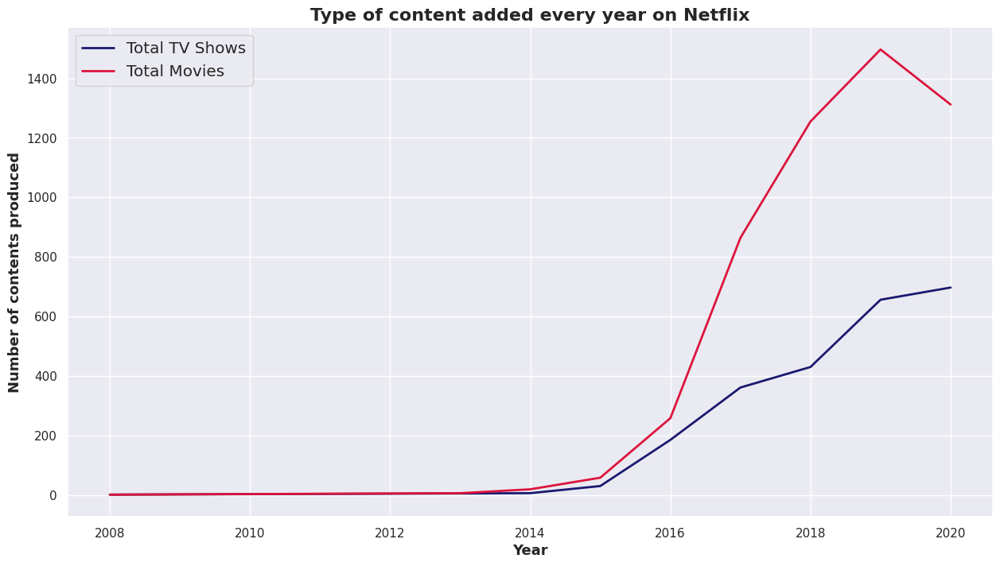

In [25]:
# Setting the size of the figure
plt.figure(figsize = (15,8))
# Plotting the lines
plt.plot(line_data['year'], line_data['total_tv'], color = 'midnightblue', linewidth = 2)
plt.plot(line_data['year'], line_data['total_movies'], color = 'crimson', linewidth = 2)
# Assigning the labels
plt.ylabel('Number of contents produced', fontsize = 13, fontweight = 'bold')
plt.xlabel('Year', fontsize = 13, fontweight = 'bold')
# Adding labels
labels = ['Total TV Shows','Total Movies']
plt.legend(labels = labels, fontsize = 'large')
plt.title('Type of content added every year on Netflix', fontsize = 16, fontweight = "bold")
plt.show();

**Observation:**

Netflix really took off since 2015, before which the rate at which newer contents were added were quite slow. Also, while movies are added in large numbers, their growth has stopped and the numbers went down for the first time while going from 2019 to 2020.

While in contrast, TV Shows have almost shown a steady growth and never saw any kind of drop in numbers, not even going in 2020.

In [26]:
# Creating the dataset
# Overall data
month_added_df = df.month_added.value_counts().reset_index().rename(columns={'index':'month','month_added':'total'})
month_added_df['month'] = month_added_df['month'].astype('int')
# TV data
tv_month_added = tv_df.month_added.value_counts().reset_index().rename(columns={'index':'month','month_added':'total_tv'})
tv_month_added['month'] = tv_month_added['month'].astype('int')
# Movies data
movies_month_added = movies_df.month_added.value_counts().reset_index().rename(columns={'index':'month','month_added':'total_movies'})
movies_month_added['month'] = movies_month_added['month'].astype('int')
# Merging the datasets
month_added_df = month_added_df.merge(tv_month_added, on='month')
month_added_df = month_added_df.merge(movies_month_added, on='month')
# Sorting the values
month_added_df = month_added_df.sort_values(by='month').reset_index(drop=True)
line_data = month_added_df

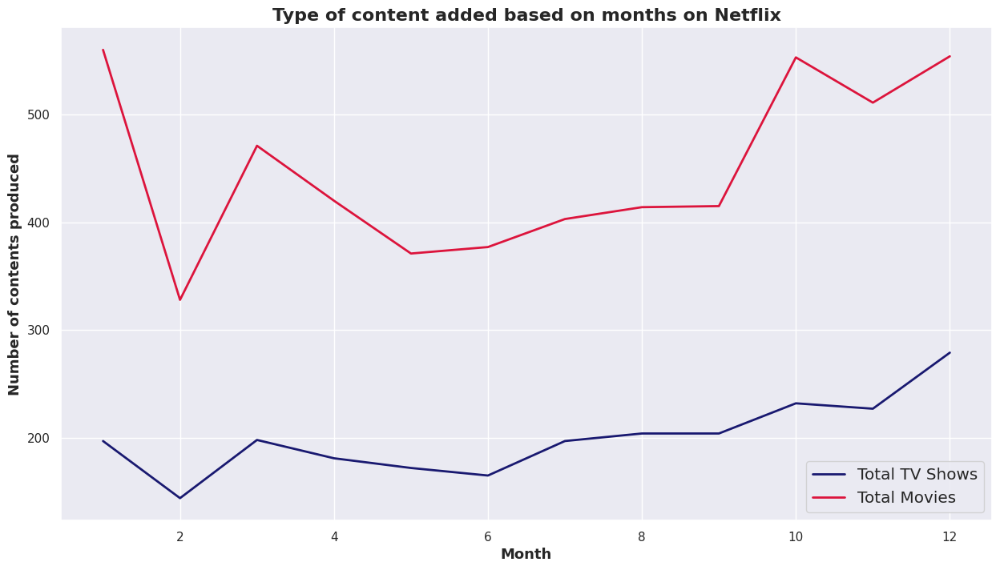

In [27]:
# Setting the size of the figure
plt.figure(figsize = (15,8))
# Plotting the lines
plt.plot(line_data['month'], line_data['total_tv'], color = 'midnightblue', linewidth = 2)
plt.plot(line_data['month'], line_data['total_movies'], color = 'crimson', linewidth = 2)
# Assigning the labels
plt.ylabel('Number of contents produced', fontsize = 13, fontweight = 'bold')
plt.xlabel('Month', fontsize = 13, fontweight = 'bold')
# Adding labels
labels = ['Total TV Shows','Total Movies']
plt.legend(labels = labels, fontsize = 'large')
plt.title('Type of content added based on months on Netflix', fontsize = 16, fontweight = "bold")
plt.show();

**Observation:**

January, December and October are the peak months. Whereas, February and May to September don't have much contents added, relatively. March has an abnormal behaviour when compared with the rest of the months.

####4.5 Which day of the week is more popular for new contents?

In [28]:
# Preparing the dataset
day_added = df.groupby('day_of_week_added').agg({'show_id':'count'}).rename(columns={'show_id':'total'}).reset_index()
tv_day = tv_df.groupby('day_of_week_added').agg({'show_id':'count'}).rename(columns={'show_id':'total_tv'}).reset_index()
movies_day = movies_df.groupby('day_of_week_added').agg({'show_id':'count'}).rename(columns={'show_id':'total_movies'}).reset_index()
day_added = day_added.merge(tv_day, on='day_of_week_added')
day_added = day_added.merge(movies_day, on='day_of_week_added')
day_added['day_of_week_added'] = day_added['day_of_week_added'].astype('int')
bar_data = day_added

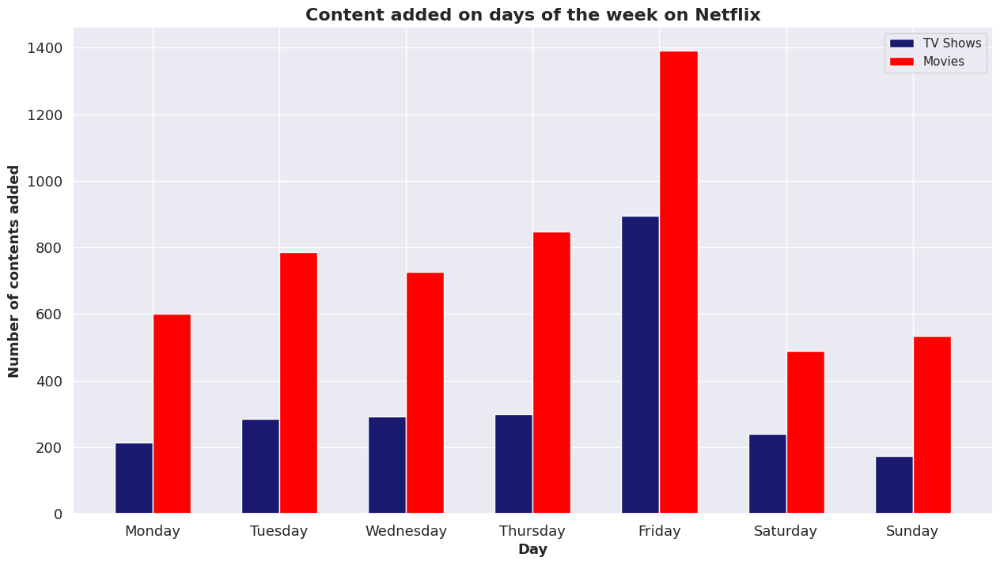

In [29]:
# Plotting the graph
plt.figure(figsize = (15,8))
x = np.arange(7)
plt.bar(x = x-0.15, 
        height = bar_data['total_tv'],
        width = 0.3,
        color = 'midnightblue')
plt.bar(x = x+0.15,
        height = bar_data['total_movies'],
        width = 0.3,
        color = 'red')
plt.xticks(x, ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], fontsize = 13)
plt.yticks(fontsize = 13)
plt.title('Content added on days of the week on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Day', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents added', fontsize = 13, fontweight = 'bold')
plt.legend(['TV Shows', 'Movies'])
plt.show();

**Observation:**

Weekends have the lowest number of releases. However, Friday has the highest of all the days of the week. Movies again are larger in number than TV Shows and the trend is almost similar between the two on all the days.

####4.6 What are the popular years of TV series and movies releases?

In [30]:
# Creating the dataset
# Overall data
release_year_df = df.release_year.value_counts().reset_index().rename(columns={'index':'year','release_year':'total'})
release_year_df['year'] = release_year_df['year'].astype('int')
# TV data
tv_release_year = tv_df.release_year.value_counts().reset_index().rename(columns={'index':'year','release_year':'total_tv'})
tv_release_year['year'] = tv_release_year['year'].astype('int')
# Movies data
movies_release_year = movies_df.release_year.value_counts().reset_index().rename(columns={'index':'year','release_year':'total_movies'})
movies_release_year['year'] = movies_release_year['year'].astype('int')
# Merging the datasets
release_year_df = release_year_df.merge(tv_release_year, on='year')
release_year_df = release_year_df.merge(movies_release_year, on='year')
# Sorting the values
release_year_df = release_year_df.sort_values(by='year').reset_index(drop=True)
release_year_df = release_year_df[release_year_df['year'].isin([x for x in range(1900,2021)])]
line_data = release_year_df

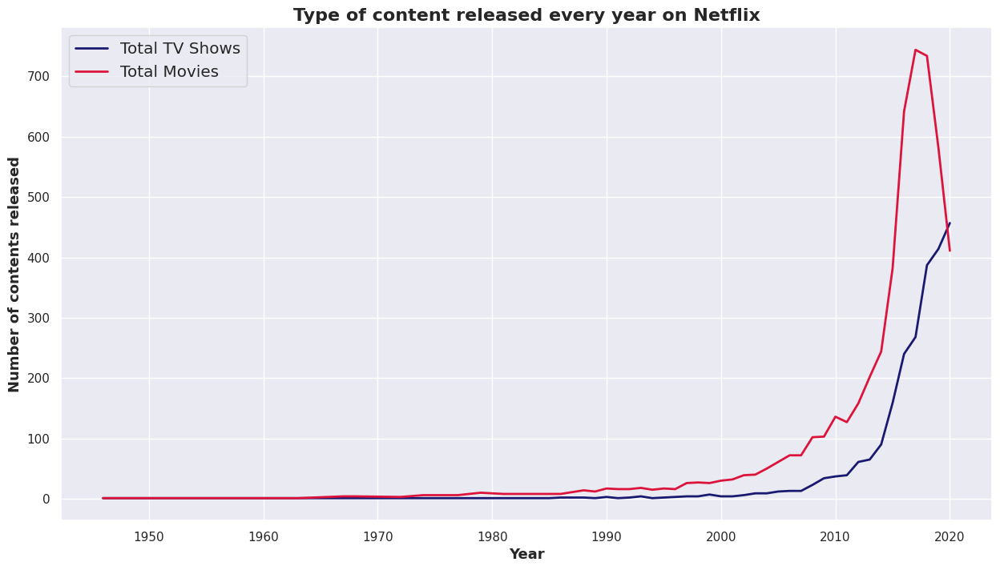

In [31]:
# Setting the size of the figure
plt.figure(figsize = (15,8))
# Plotting the lines
plt.plot(line_data['year'], line_data['total_tv'], color = 'midnightblue', linewidth = 2)
plt.plot(line_data['year'], line_data['total_movies'], color = 'crimson', linewidth = 2)
# Assigning the labels
plt.ylabel('Number of contents released', fontsize = 13, fontweight = 'bold')
plt.xlabel('Year', fontsize = 13, fontweight = 'bold')
# Adding labels
labels = ['Total TV Shows','Total Movies']
plt.legend(labels = labels, fontsize = 'large')
plt.title('Type of content released every year on Netflix', fontsize = 16, fontweight = "bold")
plt.show();

**Observation:**

Again, the content released graph has very little surprises for us. The focus has shifted a lot on releasing newer TV shows more than movies. So much has the focus shifted that for the first time ever, in 2020, the number of TV shows released surpassed the number of movie releases on Netflix. 

####4.7 What is the distribution of ratings among the contents on Netflix?

In [32]:
bar_data = df.rating.value_counts().reset_index().rename(columns={'index':'rating','rating':'count'})

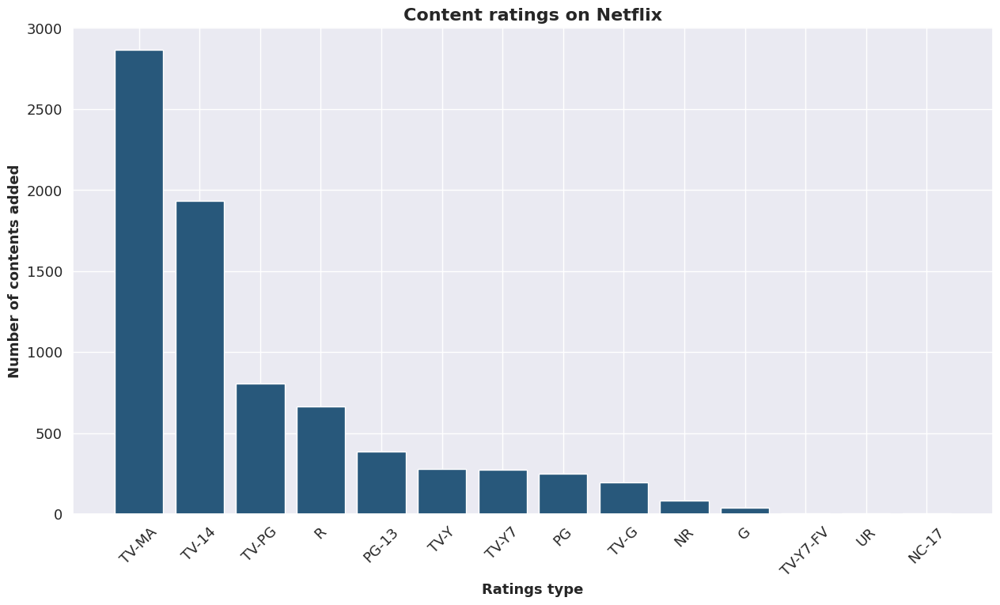

In [33]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['rating'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 45)
plt.yticks(fontsize = 13)
plt.title('Content ratings on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Ratings type', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents added', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

Contents suitable for all are very few in number whereas contents with restrictions like TV-MA (unsuitable for under 17), TV-14 (may be unsuitable for under 14) and TV-PG (unsuitable for young childern) are the three highest in numbers.

####4.8 What is the distribution of the duration of the content on Netflix?

In [34]:
# Preparing the dataset
tv_duration = tv_df.duration.value_counts().reset_index().rename(columns={'index':'No_of_seasons','duration':'count'})
new = tv_duration['No_of_seasons'].str.split(' ', expand=True)
tv_duration['No_of_seasons'] = new[0]
bar_data = tv_duration

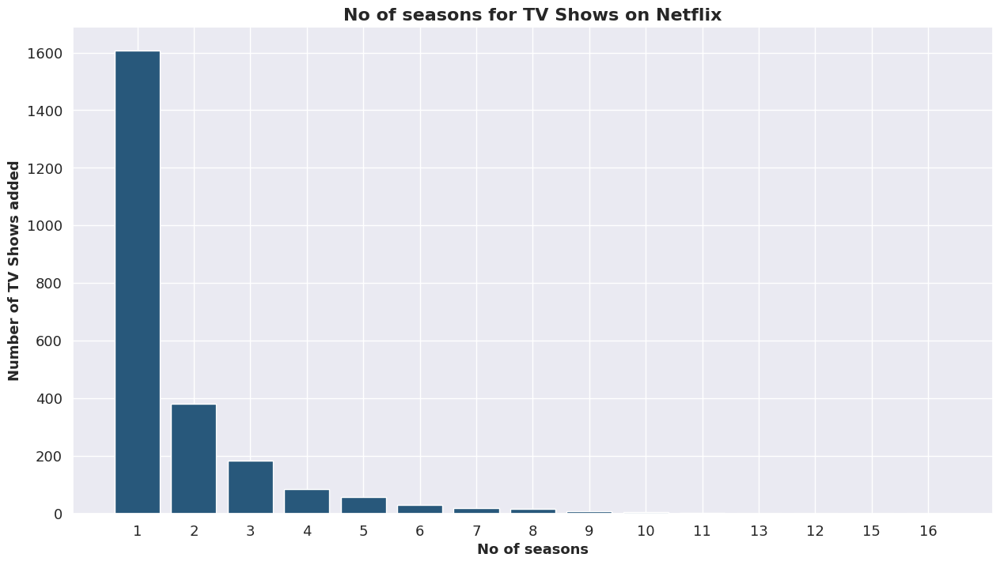

In [35]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['No_of_seasons'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
plt.title('No of seasons for TV Shows on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('No of seasons', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of TV Shows added', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

A lot of TV Shows (more than 1600) have only one season. Almost 400 have two and there is almost an exponential decrement in the number of TV Shows with even larger number of seasons.

In [36]:
# Preparing the dataset
new = movies_df.duration.str.split(' ', expand=True)
movies_duration = new[0]
movies_duration = movies_duration.astype('int')
movies_duration = movies_duration.reset_index().rename(columns={0:'No_of_mins'})
movies_duration

,index,No_of_mins
0,1,93
1,2,78
2,3,80
3,4,123
4,6,95
...,...,...
5372,7781,88
5373,7782,99
5374,7783,111
5375,7784,44


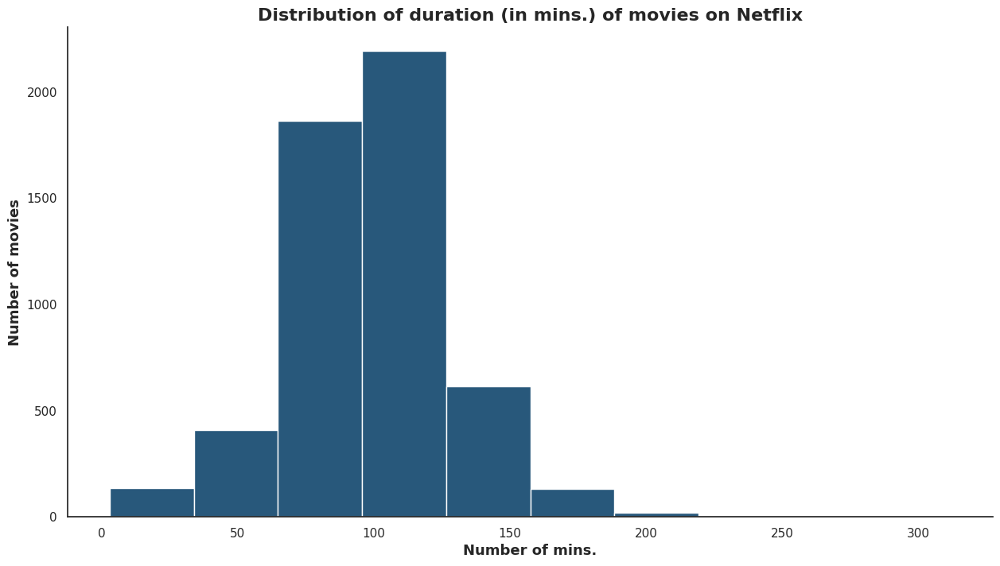

In [37]:
# Histogram plot
sns.set_style('white')
plt.figure(figsize = (15,8))
plt.hist(movies_duration['No_of_mins'],
         bins = 10,
         color = '#28587B')
plt.title('Distribution of duration (in mins.) of movies on Netflix', fontsize = 16, weight = "bold")
plt.xlabel('Number of mins.', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of movies', fontsize = 13, fontweight = 'bold')
sns.despine()
plt.show();

**Observation:**

A lot of the movies are between 60 to 150 mins long. But there are movies with more than 300+ minutes duration.

####4.9 What is the distribution of genres of the contents on Netflix?

In [38]:
# Preparing the dataset
genre_df = df['listed_in'].str.split(', ', expand=True).stack()
genre_df = genre_df.value_counts().reset_index().rename(columns={'index':'genre',0:'count'})
bar_data = genre_df.head(10)

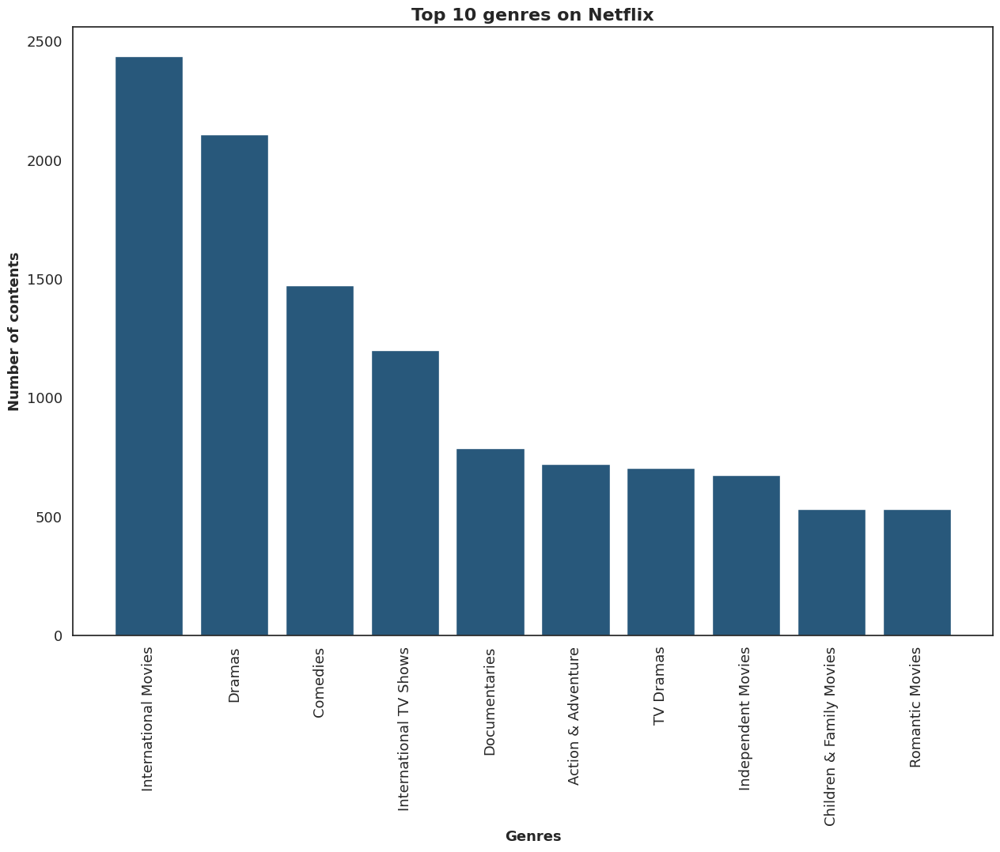

In [39]:
# Plotting the graph
plt.figure(figsize = (15,10))
plt.bar(x = bar_data['genre'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 90)
plt.yticks(fontsize = 13)
plt.title('Top 10 genres on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Genres', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

International TV Shows and International Movies are two of the most dominant genres. Others include Dramas, Comedies, Documentaries and Action & Adventure.

####4.10 Who are the top 10 directors on Netflix?

In [40]:
# Preparing the dataset
tv_director_df = tv_df.director.str.split(', ', expand=True).stack()
tv_director_df = tv_director_df.value_counts().reset_index().rename(columns={'index':'director',0:'count'})
bar_data = tv_director_df.head(10)

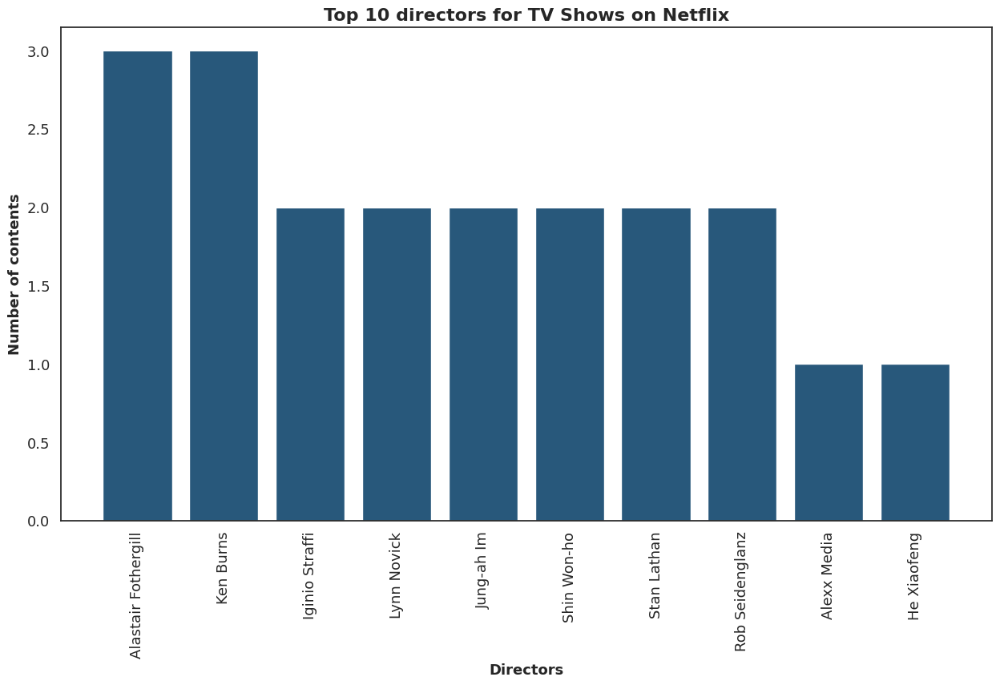

In [41]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['director'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 90)
plt.yticks(fontsize = 13)
plt.title('Top 10 directors for TV Shows on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Directors', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

The top 10 TV shows directors on Netflix doesn't feature directors with more than 3 TV Shows on the streaming service.

In [42]:
# Preparing the dataset
movies_director_df = movies_df.director.str.split(', ', expand=True).stack()
movies_director_df = movies_director_df.value_counts().reset_index().rename(columns={'index':'director',0:'count'})
bar_data = movies_director_df.head(10)

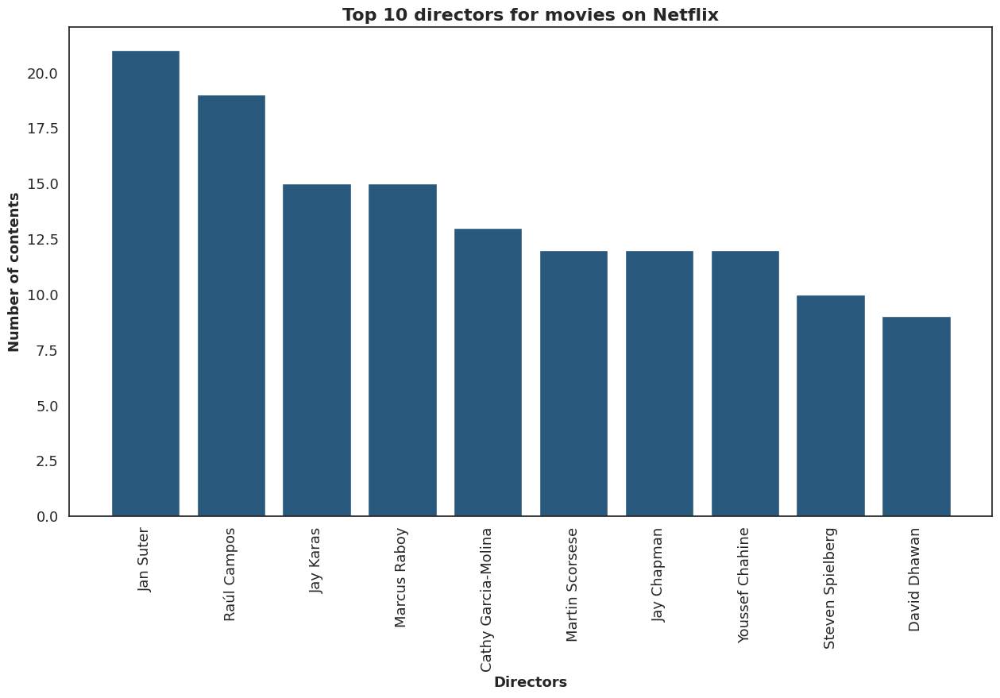

In [43]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['director'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 90)
plt.yticks(fontsize = 13)
plt.title('Top 10 directors for movies on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Directors', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

Some of the biggest names of the industry like Steven Spielberg, Martin Scorsese and Jay Chapman feature in the list of top 10 movie directors on Netflix.

####4.11 Who are the top 10 actors/actress on Netflix?

In [44]:
# Preparing the dataset
tv_cast_df = tv_df.cast.str.split(', ', expand=True).stack()
tv_cast_df = tv_cast_df.value_counts().reset_index().rename(columns={'index':'actor',0:'count'})
bar_data = tv_cast_df.head(10)

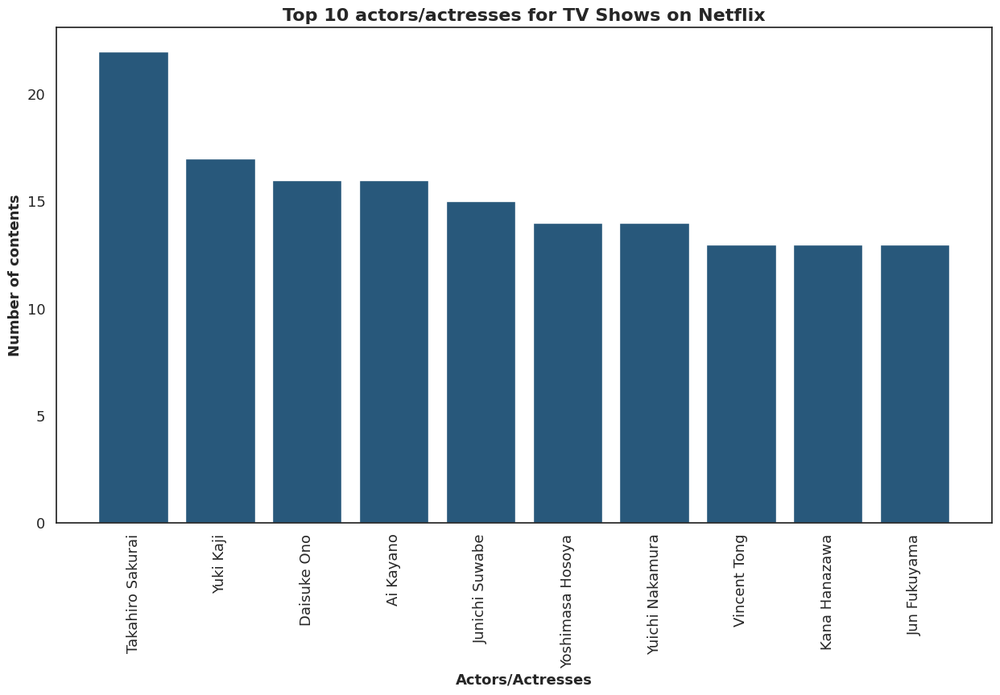

In [45]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['actor'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 90)
plt.yticks(fontsize = 13)
plt.title('Top 10 actors/actresses for TV Shows on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Actors/Actresses', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

A lot of Asian, perhaps East Asian actors feature on the list of top 10 actors/actresses for TV Shows on Netflix.

In [46]:
# Preparing the dataset
movies_cast_df = movies_df.cast.str.split(', ', expand=True).stack()
movies_cast_df = movies_cast_df.value_counts().reset_index().rename(columns={'index':'actor',0:'count'})
bar_data = movies_cast_df.head(10)

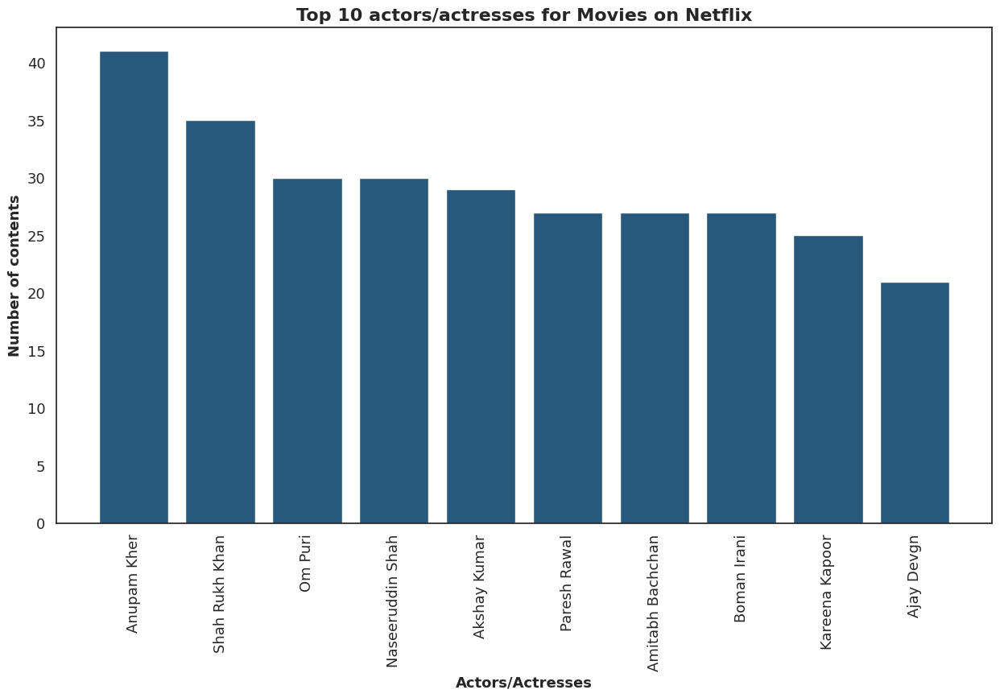

In [47]:
# Plotting the graph
plt.figure(figsize = (15,8))
plt.bar(x = bar_data['actor'], 
        height = bar_data['count'],
        color = '#28587B')
plt.xticks(fontsize = 13, rotation = 90)
plt.yticks(fontsize = 13)
plt.title('Top 10 actors/actresses for Movies on Netflix', fontsize = 16, fontweight = 'bold')
plt.xlabel('Actors/Actresses', fontsize = 13, fontweight = 'bold')
plt.ylabel('Number of contents', fontsize = 13, fontweight = 'bold')
plt.show();

**Observation:**

The list is full of A-listers from Bollywood, as expected given the number of movies from India on Netflix.

## ***5. Hypothesis Testing***

In [48]:
# Creating a copy for hypothesis testing
hypothesis_df = df.copy()

In [49]:
# Preparing the dataset
hypothesis_df['year_added'] = hypothesis_df['year_added'].astype('object')
hypothesis_df['year_added'] = hypothesis_df['year_added'][:-4]
hypothesis_df['release_year'] = hypothesis_df['release_year'].astype('object')
hypothesis_df['Netflix_Originals'] = np.where(hypothesis_df.year_added==hypothesis_df.release_year, 1, 0)

#### Hypothesis Testing 1 - Checking the relation between Originals and TV ratings

**Null Hypothesis H0:** The kind of content is independent on TV Ratings (Contents aren't restrictive)

**Alternate Hypothesis H1:** There is a dependency and Netflix focuses only on Originals of only certain types of TV Ratings (Netflix Originals are restrictive)

**Test:** Chi-square test

**Significance Level:** 0.05

In [50]:
# Preparing the contingency table
contingency_table = pd.crosstab(hypothesis_df.Netflix_Originals, hypothesis_df.rating)
contingency_table

rating,G,NC-17,NR,PG,PG-13,R,TV-14,TV-G,TV-MA,TV-PG,TV-Y,TV-Y7,TV-Y7-FV,UR
Netflix_Originals,,,,,,,,,,,,,,
0,33,3,67,206,329,575,1382,114,1395,553,140,150,5,5
1,6,0,17,41,57,90,549,80,1468,253,140,121,1,0


In [51]:
# Chi-square test
X2, p_value, degree_freedom, expected_values = scipy.stats.chi2_contingency(contingency_table, correction = True)
print("X2: {0}, p-value: {1}".format(X2, p_value))

X2: 661.0557432516437, p-value: 7.198786177322226e-133


**Conclusion:**

Given our very low p-value, we have to reject the null hypothesis that there is difference in the TV ratings for Netflix's original and non-original contents. There is significant evidence to reject our null hypothesis.

#### Hypothesis Testing 2 - Is there a difference in the duration of Netflix Originals movies and the other movies?

**Null Hypothesis H0:** The duration for the two are not from different distributions

**Alternate Hypothesis H1:** The duration for the two are from different distributions

**Test:** z-test

**Significance Level:** 0.05

In [52]:
# Preparing the dataset
movies = hypothesis_df.copy()
movies = movies[movies.type=='Movie']
movies['mins'] = movies['duration'].str.split(' ', expand=True)[0]
movies['mins'] = movies['mins'].astype('int')
movies_NO = movies[movies.Netflix_Originals==1]
movies_NNO = movies[movies.Netflix_Originals==0]

In [53]:
movies_NO.dropna(inplace=True)
movies_NNO.dropna(inplace=True)

In [54]:
# Z-test 
z_statistic, p_value = ztest(movies_NO['mins'], movies_NNO['mins'], value=0) 
print("z-statistic: {0}, p-value: {1}".format(z_statistic, p_value))

z-statistic: -15.877129121894127, p-value: 9.126081077037407e-57


**Conclusion:**

Since the p-value is very low, we will once again reject the null hypothesis that the duration of the Netflix Original movies and the other movies are not from two different distributions.

## ***6. Feature Engineering & Data Pre-processing***

####Handling Missing Values

show_id                  0
type                     0
title                    0
director              2389
cast                   718
country                507
date_added              10
release_year             0
rating                   7
duration                 0
listed_in                0
description              0
month_added             10
day_of_week_added       10
year_added              10
day_of_month_added      10
date_month_added        10
dtype: int64


<Axes: >

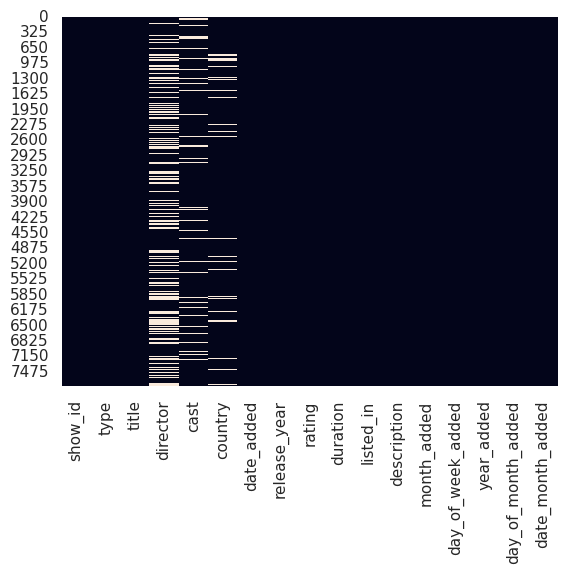

In [55]:
# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(df.isnull().sum())

# Checking Null Value by plotting Heatmap
sns.heatmap(df.isnull(), cbar=False)

Clustering will see a lot of categorical or text-based (object) variables grouped into one big text variable and then worked on. So, we can impute the missing values from director, cast and country with an empty space.

As for date_added and the columns generated using it and the rating column, we will delete the rows with missing values.

In [56]:
# Deleting and checking again
df = df.dropna(subset = ['date_added', 'rating'])
null_columns = ['director', 'cast', 'country']
df[null_columns] = df[null_columns].fillna(' ')
print(df.isnull().sum())

show_id               0
type                  0
title                 0
director              0
cast                  0
country               0
date_added            0
release_year          0
rating                0
duration              0
listed_in             0
description           0
month_added           0
day_of_week_added     0
year_added            0
day_of_month_added    0
date_month_added      0
dtype: int64


####Handling Outliers

In [57]:
df.info()
netflix = df.copy()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7770 entries, 0 to 7786
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   show_id             7770 non-null   object        
 1   type                7770 non-null   object        
 2   title               7770 non-null   object        
 3   director            7770 non-null   object        
 4   cast                7770 non-null   object        
 5   country             7770 non-null   object        
 6   date_added          7770 non-null   datetime64[ns]
 7   release_year        7770 non-null   int64         
 8   rating              7770 non-null   object        
 9   duration            7770 non-null   object        
 10  listed_in           7770 non-null   object        
 11  description         7770 non-null   object        
 12  month_added         7770 non-null   float64       
 13  day_of_week_added   7770 non-null   float64     

There are no numeric columns that may have the possibility of having outliers of no importance. And so we are skipping this step. 

####Categorical Encoding

In [58]:
# Dummy encoding the categorical variables
categorical_columns = ['type', 'rating']
df = pd.get_dummies(df, columns = categorical_columns, drop_first = True)
df.head()

,show_id,title,director,cast,country,date_added,release_year,duration,listed_in,description,...,rating_PG-13,rating_R,rating_TV-14,rating_TV-G,rating_TV-MA,rating_TV-PG,rating_TV-Y,rating_TV-Y7,rating_TV-Y7-FV,rating_UR
0,s1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,...,0,0,0,0,1,0,0,0,0,0
1,s2,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,...,0,0,0,0,1,0,0,0,0,0
2,s3,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",...,0,1,0,0,0,0,0,0,0,0
3,s4,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",...,1,0,0,0,0,0,0,0,0,0
4,s5,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,123 min,Dramas,A brilliant group of students become card-coun...,...,1,0,0,0,0,0,0,0,0,0


We have dummy encoded the two categorical variables (non-text data) that existed and are not to be joined later for the TF-IDF process.

####Data Scaling

In [59]:
# Selecting the numerical columns and using normalisation process
numerical_columns = ['release_year', 'month_added', 'day_of_week_added', 'year_added', 'day_of_month_added']
mm = MinMaxScaler()
df[numerical_columns] = mm.fit_transform(df[numerical_columns])

####Selecting Columns for Textual Pre-Processing

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7770 entries, 0 to 7786
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   show_id             7770 non-null   object        
 1   title               7770 non-null   object        
 2   director            7770 non-null   object        
 3   cast                7770 non-null   object        
 4   country             7770 non-null   object        
 5   date_added          7770 non-null   datetime64[ns]
 6   release_year        7770 non-null   float64       
 7   duration            7770 non-null   object        
 8   listed_in           7770 non-null   object        
 9   description         7770 non-null   object        
 10  month_added         7770 non-null   float64       
 11  day_of_week_added   7770 non-null   float64       
 12  year_added          7770 non-null   float64       
 13  day_of_month_added  7770 non-null   float64     

In [61]:
# Joining the text features
df['text'] = df['title'] + ' ' + df['director'] + ' ' + df['cast'] + ' ' + df['country'] + ' ' + df['duration'] + ' ' + df['listed_in'] + ' ' + df['description']

In [62]:
# Deleting the unwanted columns
df = df.drop(columns=['show_id', 'date_added', 'date_month_added', 'title', 'director', 'cast', 'country', 'duration', 'listed_in', 'description'])

We joined all the textual data into one column and deleted all the columns we knew are now not relevant with the clustering process.

####Lowering the case and removing stopwords

In [63]:
# Stopwords in english
stopwords_set = stopwords.words('english')
print(stopwords_set)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [64]:
# Creating a function to lower the case and check if the word is a stopword
# And if not, we add it in the list and then return as string
def lowering_case_removing_stopwords(row):
  row = [word.lower() for word in row.split() if word.lower() not in stopwords_set]
  return ' '.join(row)

# Applying the function to the text column
df['text'] = df['text'].apply(lowering_case_removing_stopwords)

We removed all the stopwords from our text data and also have lowered the case for the words in all the documents of the corpus.

####Removing punctuations

In [65]:
# Punctuations in english
punctuations = string.punctuation
print(punctuations)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [66]:
# Creating a function to remove all the punctuations from the text
# Replacing them with an empty character
def remove_punctuations(row):
   return row.translate(str.maketrans('','',punctuations))

# Applying the function to the text column
df['text'] = df['text'].apply(remove_punctuations)

We have removed all the punctuations from the text column of the dataset.

####Stemming

In [67]:
# Stemmer of english language
stemmer = SnowballStemmer('english')

In [68]:
# Creating a function for stemming the text
def stemming(row):
  row = [stemmer.stem(word) for word in row.split()]
  return ' '.join(row)

# Applying the function to text column
df['text'] = df['text'].apply(stemming)

We have stemmed all the words to their roots from the text column of the dataset.

####Text Vectorisation

In [69]:
# Text Vectorisation
tf_idf = TfidfVectorizer(stop_words='english', max_features=8000)
df_tf_idf = tf_idf.fit_transform(df['text']).toarray()

We have vectorised the text using the TF-IDF text vectorisation technique.

####Dimensionality Reduction

In [70]:
# Using PCA to reduce dimensions
pca = PCA(random_state=0)
pca.fit(df_tf_idf)

PCA(random_state=0)

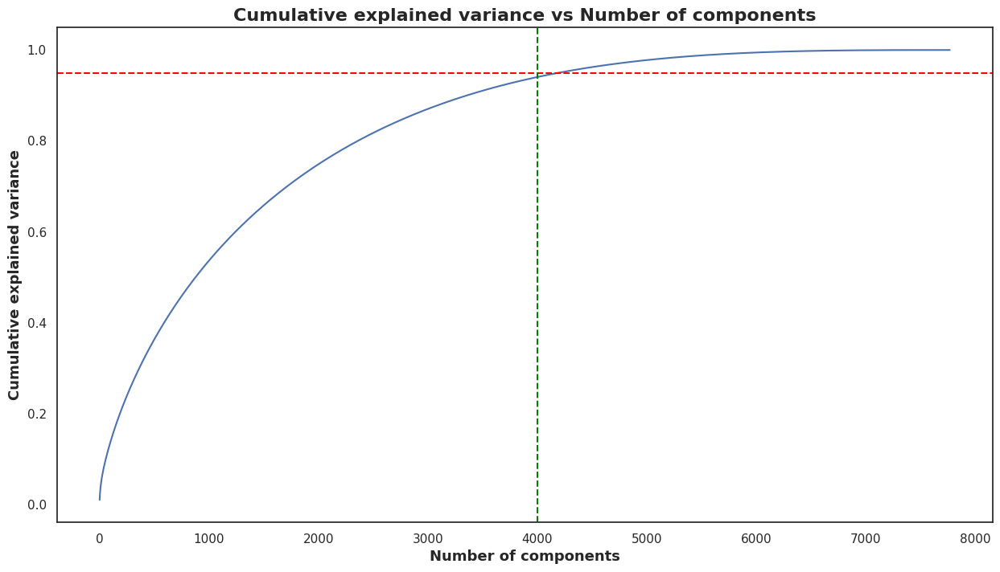

In [71]:
# Plotting the PCA graph
plt.figure(figsize=(15,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative explained variance vs Number of components', fontsize = 16, fontweight = 'bold')
plt.xlabel('Number of components', fontsize = 13, fontweight = 'bold')
plt.ylabel('Cumulative explained variance', fontsize = 13, fontweight = 'bold')
plt.axhline(y=0.95, color='red', linestyle='--')
plt.axvline(x=4000, color='green', linestyle='--')
plt.show();

We can see that the first 4000 components explain 95% of the variance and thus we will use only those.

In [72]:
# Thus fitting only 4000 components
pca = PCA(n_components=0.95, random_state=0)
X = pca.fit_transform(df_tf_idf)

In [73]:
X.shape

(7770, 4198)

####Final dataset

In [74]:
# Dropping text column from the dataset
df = df.drop(columns=['text'])

In [75]:
# Converting the dataframe into array format
df = df.to_numpy()

In [76]:
# Concatenating the two arrays to prepare the final dataset
X = np.concatenate([df, X], axis=1)

In [77]:
X.shape

(7770, 4217)

## ***7. ML Model Implementation***

#### ML Model - 1 - **Implementing KMeans Clustering**

In [78]:
# KMeans Clustering Algorithm Implementation
SSE = []
silhouette_avg = []
# Looping over the number of clusters
for k in range(2,16):
  # Running KMeans on clusters values from 2 to 15
  kmeans = KMeans(n_clusters=k, random_state=0)
  kmeans.fit(X)
  # Computing the sum of squared errors
  SSE.append(kmeans.inertia_)
  # Computing the silhouette score
  labels = kmeans.labels_
  score = silhouette_score(X,labels)
  silhouette_avg.append(score)

KMeans(n_clusters=2, random_state=0)

KMeans(n_clusters=3, random_state=0)

KMeans(n_clusters=4, random_state=0)

KMeans(n_clusters=5, random_state=0)

KMeans(n_clusters=6, random_state=0)

KMeans(n_clusters=7, random_state=0)

KMeans(random_state=0)

KMeans(n_clusters=9, random_state=0)

KMeans(n_clusters=10, random_state=0)

KMeans(n_clusters=11, random_state=0)

KMeans(n_clusters=12, random_state=0)

KMeans(n_clusters=13, random_state=0)

KMeans(n_clusters=14, random_state=0)

KMeans(n_clusters=15, random_state=0)

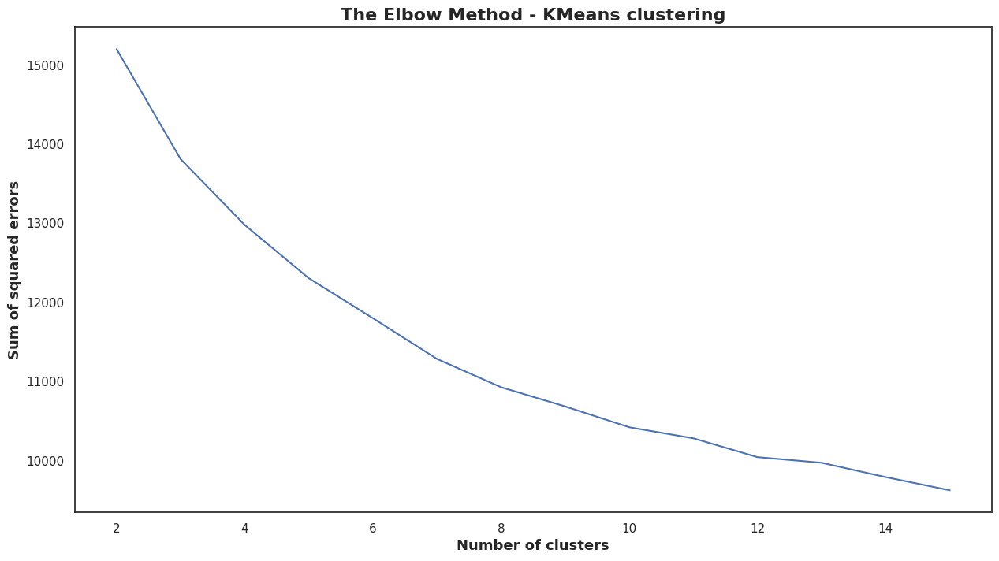

In [79]:
# Plotting the values of SSE
plt.figure(figsize=(15,8))
plt.plot(range(2,16), SSE)
plt.title('The Elbow Method - KMeans clustering', fontsize = 16, fontweight = 'bold')
plt.xlabel('Number of clusters', fontsize = 13, fontweight = 'bold')
plt.ylabel('Sum of squared errors', fontsize = 13, fontweight = 'bold')
plt.show();

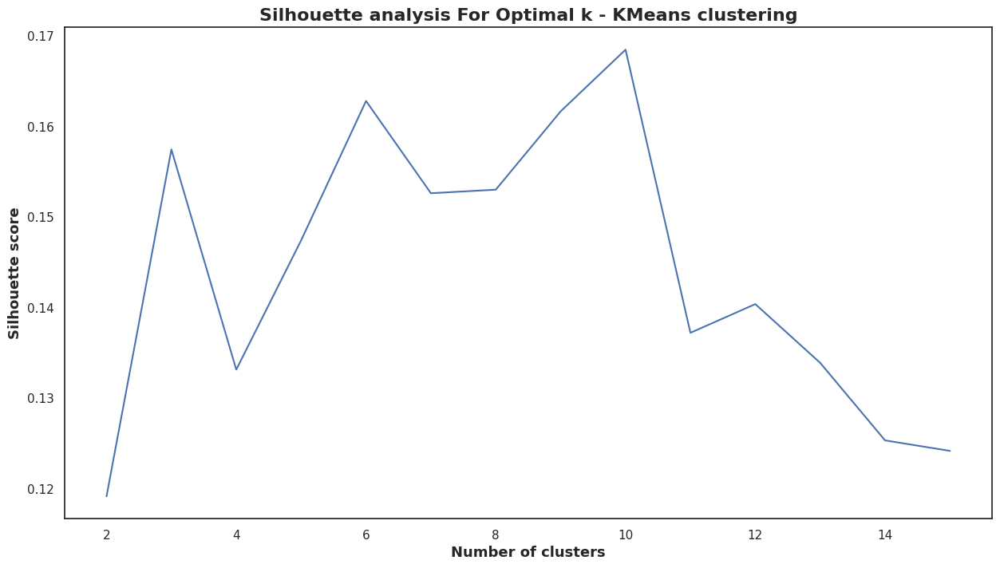

In [80]:
# Plotting the Silhouette analysis
plt.figure(figsize=(15,8))
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters', fontsize = 13, fontweight = 'bold') 
plt.ylabel('Silhouette score', fontsize = 13, fontweight = 'bold')
plt.title('Silhouette analysis For Optimal k - KMeans clustering', fontsize = 16, fontweight = 'bold')
plt.show();

**Observation:**

The elbow method technically fails in our case as it gives us a very smooth curve. However, from the silhouette score, we can say that 10 is the right number of clusters for our problem.

In [81]:
#training the K-means model on a dataset  
kmeans = KMeans(n_clusters=10, random_state=0)  
y_predict = kmeans.fit_predict(X) 

In [82]:
# Assigning the cluster values to the dataset
netflix['kmeans_cluster'] = y_predict

In [83]:
# Sampling data from each cluster
for i in range(10):
  sample_df = netflix[netflix.kmeans_cluster==i]
  print()
  print('=============================================')
  print(f'Sample from cluser {i}')
  print()
  sample_df.sample(10)


Sample from cluser 0



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
7569,s7570,Movie,What Would Sophia Loren Do?,Ross Kauffman,"Nancy ""Vincenza Careri"" Kulik, Sophia Loren",United States,2021-01-15,2021,TV-14,32 min,Documentaries,"In this delightful short documentary, an Itali...",1.00,4.00,2021.00,15.00,15-01 00:00:00,0
727,s728,Movie,Bangkok Traffic (Love) Story,Adisorn Tresirikasem,"Theeradej Wongpuapan, Sirin Horwang, Ungsumaly...",Thailand,2018-09-05,2009,TV-14,126 min,"Comedies, International Movies, Romantic Movies",After an encounter with an engineer working th...,9.00,2.00,2018.00,5.00,05-09 00:00:00,0
3284,s3285,Movie,Kacche Dhaagey,Buta Singh,"Yograj Singh, Nitu Pandher, Deep Mandian, Shre...",India,2017-11-01,2016,TV-14,120 min,"Dramas, International Movies, Romantic Movies","While visiting India for her cousin's wedding,...",11.00,2.00,2017.00,1.00,01-11 00:00:00,0
6925,s6926,Movie,The Thief and the Imbecile,"Mohammed El-Tahawy, Mohamed Mostafa","Khaled El Sawy, Khaled Saleh, Ruby",Egypt,2019-06-06,2013,TV-14,96 min,"Dramas, International Movies",A street beggar befriends a man who lost his e...,6.00,3.00,2019.00,6.00,06-06 00:00:00,0
1265,s1266,Movie,Chalte Chalte,Aziz Mirza,"Shah Rukh Khan, Rani Mukerji, Jas Arora, Satis...",India,2018-07-01,2003,TV-14,166 min,"Dramas, International Movies, Romantic Movies",Priya and Raj are polar opposites. Raj is bras...,7.00,6.00,2018.00,1.00,01-07 00:00:00,0
4721,s4722,Movie,Paan Singh Tomar,Tigmanshu Dhulia,"Irrfan Khan, Mahie Gill, Rajendra Gupta, Brije...",India,2018-11-01,2010,TV-14,129 min,"Action & Adventure, Dramas, International Movies",Paan Singh Tomar goes from celebrated runner t...,11.00,3.00,2018.00,1.00,01-11 00:00:00,0
7613,s7614,Movie,Why Are We Getting So Fat?,"Milla Harrison-Hansley, Alicky Sussman",Giles Yeo,United Kingdom,2019-02-01,2016,TV-14,50 min,Documentaries,A Cambridge geneticist dispels misconceptions ...,2.00,4.00,2019.00,1.00,01-02 00:00:00,0
883,s884,Movie,Bhai: Vyakti Ki Valli - Poorvardha,Mahesh Manjrekar,"Sagar Deshmukh, Vijay Kenkre, Iravati Harshe, ...",India,2020-09-10,2019,TV-14,116 min,"Dramas, International Movies",This first of a two-part biopic depicts the ea...,9.00,3.00,2020.00,10.00,10-09 00:00:00,0
5150,s5151,Movie,ReMastered: The Lion's Share,Sam Cullman,,,2019-05-17,2019,TV-14,84 min,"Documentaries, Music & Musicals","After discovering the family of Solomon Linda,...",5.00,4.00,2019.00,17.00,17-05 00:00:00,0
6771,s6772,Movie,The Polka King,Maya Forbes,"Jack Black, Jenny Slate, Jason Schwartzman, Ja...",United States,2018-01-12,2018,TV-14,94 min,"Comedies, Independent Movies","Determined to make it big in America, Polish-b...",1.00,4.00,2018.00,12.00,12-01 00:00:00,0



Sample from cluser 1



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
4234,s4235,Movie,Mostly Sunny,Dilip Mehta,Sunny Leone,Canada,2017-05-01,2016,TV-MA,83 min,"Documentaries, International Movies",Explore the unconventional career of Sunny Leo...,5.00,0.00,2017.00,1.00,01-05 00:00:00,1
5928,s5929,Movie,Susanne Bartsch: On Top,"Anthony Caronna, Alexander Smith",Susanne Bartsch,United States,2018-12-10,2017,TV-MA,86 min,"Documentaries, LGBTQ Movies","Beyond her larger-than-life persona, this docu...",12.00,0.00,2018.00,10.00,10-12 00:00:00,1
5196,s5197,Movie,Ricardo O'Farrill: Abrazo navideño,"Raúl Campos, Jan Suter","Ricardo O'Farrill, Carlos Ballarta, Sofía Niño...",Mexico,2016-12-12,2016,TV-MA,31 min,Stand-Up Comedy,The expressive Ricardo O'Farrill uses his astu...,12.00,0.00,2016.00,12.00,12-12 00:00:00,1
5141,s5142,Movie,Regatta,Mohamed Samy,"Amr Saad, Ilham Shaheen, Rania Yousef",Egypt,2019-05-09,2015,TV-MA,100 min,"Action & Adventure, Dramas, International Movies",Inside one of Cairo's most impoverished areas ...,5.00,3.00,2019.00,9.00,09-05 00:00:00,1
54,s55,Movie,100 Meters,Marcel Barrena,"Dani Rovira, Karra Elejalde, Alexandra Jiménez...","Portugal, Spain",2017-03-10,2016,TV-MA,109 min,"Dramas, International Movies, Sports Movies",A man who is diagnosed with multiple sclerosis...,3.00,4.00,2017.00,10.00,10-03 00:00:00,1
6399,s6400,Movie,The Golem,"Doron Paz, Yoav Paz","Hani Furstenberg, Ishai Golan, Kirill Cernyako...",Israel,2019-06-26,2018,TV-MA,95 min,"Horror Movies, Independent Movies, Internation...",As sickness spreads throughout the countryside...,6.00,2.00,2019.00,26.00,26-06 00:00:00,1
3131,s3132,Movie,Jealousy and medicine,Janusz Majewski,"Mariusz Dmochowski, Ewa Krzyżewska, Włodzimier...",Poland,2019-10-01,1973,TV-MA,97 min,"Dramas, International Movies, Romantic Movies","Tormented by mistrust, a businessman hires a c...",10.00,1.00,2019.00,1.00,01-10 00:00:00,1
5537,s5538,Movie,Shakti: The Power,Krishna Vamshi,"Karisma Kapoor, Nana Patekar, Sanjay Kapoor, S...",India,2018-03-01,2002,TV-MA,168 min,"Dramas, International Movies, Thrillers",A young mother must break free of the clutches...,3.00,3.00,2018.00,1.00,01-03 00:00:00,1
2664,s2665,Movie,Hazel Brugger: Tropical,,Hazel Brugger,Germany,2020-12-02,2020,TV-MA,58 min,Stand-Up Comedy,"In this stand-up special, comedian Hazel Brugg...",12.00,2.00,2020.00,2.00,02-12 00:00:00,1
918,s919,Movie,Bill Burr: You People Are All the Same,Jay Karas,Bill Burr,United States,2018-06-30,2012,TV-MA,69 min,Stand-Up Comedy,Funnyman Bill Burr takes the stage to uncork a...,6.00,5.00,2018.00,30.00,30-06 00:00:00,1



Sample from cluser 2



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
7048,s7049,TV Show,This Evening,,"Eyad Nassar, Ahmed Dawood, Mohamed Farraag, Ha...",Egypt,2019-03-11,2017,TV-14,1 Season,"International TV Shows, TV Dramas",The lives of a wealthy couple hiding their mar...,3.00,0.00,2019.00,11.00,11-03 00:00:00,2
5036,s5037,TV Show,Queens vs. Kings,,"Varun Thakur, Anu Menon, Rahul Subramanian, Si...",,2018-10-25,2018,TV-14,1 Season,"Stand-Up Comedy & Talk Shows, TV Comedies","No ""ism"" is left unturned in this celebrity ga...",10.00,3.00,2018.00,25.00,25-10 00:00:00,2
6958,s6959,TV Show,The Umbrella Academy,,,"United States, Canada",2020-07-31,2020,TV-14,2 Seasons,"TV Action & Adventure, TV Mysteries, TV Sci-Fi...","Reunited by their father's death, estranged si...",7.00,4.00,2020.00,31.00,31-07 00:00:00,2
7553,s7554,TV Show,What Happens to My Family,,"Settar Tanrıöğen, Uraz Kaygılaroğlu, Berna Kor...",Turkey,2017-05-05,2016,TV-14,1 Season,"International TV Shows, TV Comedies, TV Dramas",A naïve young woman goes to Istanbul to meet t...,5.00,4.00,2017.00,5.00,05-05 00:00:00,2
2960,s2961,TV Show,In Between,,"Janel Tsai, Johnny Lu, Darren Chiu, Vivi Lee, ...",Taiwan,2017-01-01,2012,TV-14,1 Season,"International TV Shows, Romantic TV Shows, TV ...",An author having trouble finishing his new rom...,1.00,6.00,2017.00,1.00,01-01 00:00:00,2
4996,s4997,TV Show,Puella Magi Madoka Magica,,"Aoi Yuki, Chiwa Saito, Kaori Mizuhashi, Eri Ki...",Japan,2019-06-15,2011,TV-14,1 Season,"Anime Series, International TV Shows","One day, Madoka Kaname has a very magical enco...",6.00,5.00,2019.00,15.00,15-06 00:00:00,2
3011,s3012,TV Show,Inside Bill's Brain: Decoding Bill Gates,,Bill Gates,United States,2019-09-20,2019,TV-14,1 Season,"Docuseries, Science & Nature TV",Take a trip inside the mind of Bill Gates as t...,9.00,4.00,2019.00,20.00,20-09 00:00:00,2
2494,s2495,TV Show,Goodnight DJ 1,,"Chan Fong, Z-Chen, Frederick Lee, Melvin Sia, ...",,2018-04-27,2016,TV-14,2 Seasons,"International TV Shows, TV Dramas, TV Horror",Young radio announcers from varying background...,4.00,4.00,2018.00,27.00,27-04 00:00:00,2
7678,s7679,TV Show,WWII in HD,,"Gary Sinise, Rob Lowe, Josh Lucas, Justin Bart...",United States,2020-05-02,2009,TV-14,1 Season,Docuseries,Rare color footage interwoven with firsthand i...,5.00,5.00,2020.00,2.00,02-05 00:00:00,2
3896,s3897,TV Show,Man to Man,Chang-Min Lee,"Hae-Jin Park, Sung-woong Park, Min-jung Kim, J...",South Korea,2017-06-10,2017,TV-14,1 Season,"Crime TV Shows, International TV Shows, Korean...","Disguised as a bodyguard, a special agent must...",6.00,5.00,2017.00,10.00,10-06 00:00:00,2



Sample from cluser 3



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
5538,s5539,TV Show,Shameless (U.S.),,"William H. Macy, Emmy Rossum, Justin Chatwin, ...",United States,2020-07-26,2019,TV-MA,10 Seasons,"TV Comedies, TV Dramas",This dramedy based on a British series centers...,7.00,6.00,2020.00,26.00,26-07 00:00:00,3
7539,s7540,TV Show,Westside,,,United States,2018-11-09,2018,TV-MA,1 Season,Reality TV,Nine struggling musicians share the spotlight ...,11.00,4.00,2018.00,9.00,09-11 00:00:00,3
241,s242,TV Show,A Touch of Green,,"Weber Yang, Cheryl Yang, Tien Hsin, Gabriel La...",Taiwan,2020-07-01,2016,TV-MA,1 Season,"International TV Shows, TV Dramas","Amid the turmoil of China's civil war, familie...",7.00,2.00,2020.00,1.00,01-07 00:00:00,3
4677,s4678,TV Show,Orange Is the New Black,,"Taylor Schilling, Kate Mulgrew, Laura Prepon, ...",United States,2019-07-26,2019,TV-MA,7 Seasons,"TV Comedies, TV Dramas",A privileged New Yorker ends up in a women's p...,7.00,4.00,2019.00,26.00,26-07 00:00:00,3
2716,s2717,TV Show,Hibana: Spark,,"Kento Hayashi, Kazuki Namioka, Mugi Kadowaki, ...",Japan,2016-06-02,2016,TV-MA,1 Season,"International TV Shows, TV Dramas",A dramatic series about friendship and conflic...,6.00,3.00,2016.00,2.00,02-06 00:00:00,3
3753,s3754,TV Show,Love Family,,"Chris Wang, Serena Fang, Jack Lee, Amanda Chou...",Taiwan,2016-11-01,2013,TV-MA,1 Season,"International TV Shows, Romantic TV Shows, TV ...",A wealthy heir's search for a nameless childho...,11.00,1.00,2016.00,1.00,01-11 00:00:00,3
5768,s5769,TV Show,Spotless,,"Marc-André Grondin, Denis Ménochet, Miranda Ra...","United Kingdom, France",2016-10-15,2015,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Dramas",The law-abiding owner of a crime scene cleanin...,10.00,5.00,2016.00,15.00,15-10 00:00:00,3
5238,s5239,TV Show,Robotech,,"Jean-Claude Ballard, Gregory Snegoff, Cam Clar...","United States, Japan",2016-10-01,1985,TV-MA,1 Season,Anime Series,When a mysterious spaceship crashes in the Pac...,10.00,5.00,2016.00,1.00,01-10 00:00:00,3
1278,s1279,TV Show,Charité at War,,"Mala Emde, Ulrich Noethen, Jannik Schümann, Ar...",,2019-06-15,2019,TV-MA,1 Season,"International TV Shows, TV Dramas","In 1943, the staff at Berlin's Charité hospita...",6.00,5.00,2019.00,15.00,15-06 00:00:00,3
707,s708,TV Show,Bala Loca,,"Alejandro Goic, Trinidad González, Ingrid Isen...",Chile,2017-04-01,2016,TV-MA,1 Season,"International TV Shows, Spanish-Language TV Sh...",A veteran journalist starting a news site abou...,4.00,5.00,2017.00,1.00,01-04 00:00:00,3



Sample from cluser 4



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
3558,s3559,Movie,Leap!,"Eric Summer, Éric Warin","Bronwen Mantel, Mel Brooks, Maddie Ziegler, Da...","France, Canada",2021-01-07,2016,PG,89 min,"Children & Family Movies, Comedies","Félicie and Victor, two young friends in 1880s...",1.00,3.00,2021.00,7.00,07-01 00:00:00,4
905,s906,Movie,Big Miracle,Ken Kwapis,"Drew Barrymore, John Krasinski, Kristen Bell, ...","United States, United Kingdom",2018-09-30,2012,PG,107 min,"Children & Family Movies, Dramas",After a reporter writes about whales trapped i...,9.00,6.00,2018.00,30.00,30-09 00:00:00,4
4333,s4334,Movie,My Little Pony Equestria Girls: Rainbow Rocks,"Jayson Thiessen, Ishi Rudell","Tara Strong, Ashleigh Ball, Andrea Libman, Tab...","United States, Canada",2014-12-17,2014,TV-Y,73 min,"Children & Family Movies, Comedies","Rainbow Dash, Applejack, Pinkie Pie, Rarity an...",12.00,2.00,2014.00,17.00,17-12 00:00:00,4
4697,s4698,Movie,Our Planet - Behind The Scenes,,David Attenborough,United Kingdom,2019-08-20,2019,TV-G,63 min,Documentaries,Years spent recording footage of creatures fro...,8.00,1.00,2019.00,20.00,20-08 00:00:00,4
5265,s5266,Movie,Romantik Komedi,Ketche,"Sedef Avcı, Cemal Hünal, Begüm Kütük, Engin Al...",Turkey,2017-03-10,2010,NR,110 min,"Comedies, International Movies, Romantic Movies",Bored with her life and inspired by a friend's...,3.00,4.00,2017.00,10.00,10-03 00:00:00,4
7084,s7085,Movie,Tigertail,Alan Yang,"Tzi Ma, Christine Ko, Hong-Chi Lee, Hayden Sze...",United States,2020-04-10,2020,PG,91 min,Dramas,A man reflects on the lost love of his youth a...,4.00,4.00,2020.00,10.00,10-04 00:00:00,4
1131,s1132,Movie,Bugs,Andreas Johnsen,,"Netherlands, Denmark, France, Germany",2018-02-20,2016,TV-G,73 min,"Documentaries, International Movies",A willing team of chefs and researchers goes o...,2.00,1.00,2018.00,20.00,20-02 00:00:00,4
1888,s1889,Movie,Duck Duck Goose,Chris Jenkins,"Jim Gaffigan, Zendaya, Lance Lim, Greg Proops,...","China, United States, United Kingdom",2018-07-20,2018,PG,92 min,"Children & Family Movies, Comedies","As his flock's annual migration nears, a caref...",7.00,4.00,2018.00,20.00,20-07 00:00:00,4
62,s63,Movie,13 Cameras,Victor Zarcoff,"PJ McCabe, Brianne Moncrief, Sarah Baldwin, Ji...",United States,2016-08-13,2015,NR,90 min,"Horror Movies, Independent Movies, Thrillers",Young parents-to-be Claire and Ryan move into ...,8.00,5.00,2016.00,13.00,13-08 00:00:00,4
1502,s1503,Movie,Coraline,Henry Selick,"Dakota Fanning, Teri Hatcher, John Hodgman, Je...",United States,2017-03-16,2009,PG,101 min,Children & Family Movies,Curious young Coraline unlocks a door in her f...,3.00,3.00,2017.00,16.00,16-03 00:00:00,4



Sample from cluser 5



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
7166,s7167,Movie,Tracers,Daniel Benmayor,"Luciano Acuna Jr., Adam Rayner, Marie Avgeropo...",United States,2019-10-22,2015,PG-13,94 min,Action & Adventure,When a bike messenger falls into debt with org...,10.00,1.00,2019.00,22.00,22-10 00:00:00,5
6026,s6027,Movie,Terminator Salvation,McG,"Christian Bale, Sam Worthington, Moon Bloodgoo...","United States, Germany, United Kingdom, Italy",2020-01-01,2009,PG-13,115 min,"Action & Adventure, Sci-Fi & Fantasy","All grown up in post-apocalyptic 2018, John Co...",1.00,2.00,2020.00,1.00,01-01 00:00:00,5
6955,s6956,Movie,The Two Popes,Fernando Meirelles,"Anthony Hopkins, Jonathan Pryce, Juan Minujín","United Kingdom, Italy",2019-12-20,2019,PG-13,126 min,Dramas,At a key turning point for the Catholic Church...,12.00,4.00,2019.00,20.00,20-12 00:00:00,5
4541,s4542,Movie,November Criminals,Sacha Gervasi,"Ansel Elgort, Chloë Grace Moretz, David Strath...",United States,2020-07-03,2017,PG-13,86 min,"Dramas, Thrillers","Dissatisfied with the police’s progress, a tee...",7.00,4.00,2020.00,3.00,03-07 00:00:00,5
2370,s2371,Movie,Generation Iron 2,Vlad Yudin,,United States,2017-10-01,2017,PG-13,107 min,"Documentaries, Sports Movies",New-generation bodybuilding stars – including ...,10.00,6.00,2017.00,1.00,01-10 00:00:00,5
2756,s2757,Movie,Hitch,Andy Tennant,"Will Smith, Eva Mendes, Kevin James, Amber Val...",United States,2020-01-01,2005,PG-13,118 min,"Comedies, Romantic Movies",Smooth and sexy Hitch helps clients make a gre...,1.00,2.00,2020.00,1.00,01-01 00:00:00,5
5451,s5452,Movie,Season of the Witch,Dominic Sena,"Nicolas Cage, Ron Perlman, Christopher Lee, St...",United States,2019-04-26,2011,PG-13,95 min,"Action & Adventure, Sci-Fi & Fantasy",A group of weary warriors transport a suspecte...,4.00,4.00,2019.00,26.00,26-04 00:00:00,5
6889,s6890,Movie,The Space Between Us,Peter Chelsom,"Gary Oldman, Asa Butterfield, Carla Gugino, Br...",United States,2019-06-01,2016,PG-13,120 min,"Action & Adventure, Romantic Movies, Sci-Fi & ...","After years of limited contact with Earth, an ...",6.00,5.00,2019.00,1.00,01-06 00:00:00,5
635,s636,Movie,Avengers: Infinity War,"Anthony Russo, Joe Russo","Robert Downey Jr., Josh Brolin, Mark Ruffalo, ...",United States,2018-12-25,2018,PG-13,150 min,"Action & Adventure, Sci-Fi & Fantasy",Superheroes amass to stop intergalactic sociop...,12.00,1.00,2018.00,25.00,25-12 00:00:00,5
96,s97,Movie,3 Days to Kill,McG,"Kevin Costner, Amber Heard, Hailee Steinfeld, ...","United States, France, Serbia",2020-12-01,2014,PG-13,117 min,Action & Adventure,A terminally ill secret agent accepts a risky ...,12.00,1.00,2020.00,1.00,01-12 00:00:00,5



Sample from cluser 6



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
5474,s5475,Movie,Secrets of Selfridges,Sam Taplin,Samuel West,United States,2017-04-22,2014,TV-PG,55 min,Documentaries,American Harry Gordon Selfridge introduced Lon...,4.00,5.00,2017.00,22.00,22-04 00:00:00,6
374,s375,Movie,Albion: The Enchanted Stallion,Castille Landon,"Daniel Sharman, Jennifer Morrison, Debra Messi...","United States, Bulgaria",2017-07-01,2016,TV-PG,106 min,Children & Family Movies,After a magical horse transports her to a fant...,7.00,5.00,2017.00,1.00,01-07 00:00:00,6
3154,s3155,Movie,Jerry Seinfeld: 23 Hours To Kill,Joe DeMaio,Jerry Seinfeld,United States,2020-05-05,2020,TV-PG,61 min,Stand-Up Comedy,Jerry Seinfeld takes the stage in New York and...,5.00,1.00,2020.00,5.00,05-05 00:00:00,6
2638,s2639,TV Show,Hart of Dixie,,"Rachel Bilson, Jaime King, Cress Williams, Wil...",United States,2015-12-15,2014,TV-PG,4 Seasons,"TV Comedies, TV Dramas",Fast-talking city girl Zoe Hart winds up patch...,12.00,1.00,2015.00,15.00,15-12 00:00:00,6
5425,s5426,Movie,Scandal in Sorrento,Dino Risi,"Vittorio De Sica, Sophia Loren, Lea Padovani, ...","Italy, France",2020-11-13,1955,TV-PG,93 min,"Classic Movies, Comedies, Independent Movies","When a marshal moves back to his hometown, he ...",11.00,4.00,2020.00,13.00,13-11 00:00:00,6
1091,s1092,Movie,Breaking the Bank,Vadim Jean,"Kelsey Grammer, Tamsin Greig, John Michael Hig...",United Kingdom,2020-01-01,2014,TV-PG,105 min,"Comedies, International Movies",Bank chairman Charles Bunbury – who knows next...,1.00,2.00,2020.00,1.00,01-01 00:00:00,6
6313,s6314,Movie,The Dreamer,Riri Riza,"Vikri Septiawan, Rendy Ahmad, Azwir Fitrianto,...",Indonesia,2018-10-04,2009,TV-PG,121 min,"Dramas, International Movies",A trio of friends struggles to make it through...,10.00,3.00,2018.00,4.00,04-10 00:00:00,6
1873,s1874,TV Show,DreamWorks Spooky Stories: Volume 2,,"Seth Rogen, Will Arnett, Hugh Laurie, Will Fer...",,2020-04-24,2011,TV-PG,1 Season,"Kids' TV, TV Comedies","The Shrek characters parody the music video ""T...",4.00,4.00,2020.00,24.00,24-04 00:00:00,6
1552,s1553,Movie,Cultivating the Seas: History and Future of th...,Mana Yasuda,,,2019-09-28,2019,TV-PG,45 min,"Documentaries, International Movies",An in-depth look at the full-cycle breeding pr...,9.00,5.00,2019.00,28.00,28-09 00:00:00,6
1593,s1594,Movie,Dancing with the Birds,Huw Cordey,Stephen Fry,United States,2019-10-23,2019,TV-PG,52 min,Documentaries,From ruffling their majestic feathers to naili...,10.00,2.00,2019.00,23.00,23-10 00:00:00,6



Sample from cluser 7



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
4497,s4498,TV Show,Nobel,,"Aksel Hennie, Tuva Novotny, Anders Danielsen L...",Norway,2016-12-10,2016,R,1 Season,"International TV Shows, TV Dramas, TV Thrillers",A series of incidents in Afghanistan set compl...,12.00,5.00,2016.00,10.00,10-12 00:00:00,7
6606,s6607,Movie,The Lives of Others,Florian Henckel von Donnersmarck,"Ulrich Mühe, Martina Gedeck, Sebastian Koch, U...",Germany,2019-03-15,2006,R,138 min,"Dramas, International Movies, Thrillers",As a secret police agent eavesdrops on a succe...,3.00,4.00,2019.00,15.00,15-03 00:00:00,7
4544,s4545,Movie,Nowhere Boy,Sam Taylor-Johnson,"Aaron Taylor-Johnson, Anne-Marie Duff, Kristin...","United Kingdom, Canada",2018-04-14,2009,R,99 min,Dramas,"Raised by his aunt since he was a young boy, c...",4.00,5.00,2018.00,14.00,14-04 00:00:00,7
5166,s5167,Movie,Resident Evil: Afterlife,Paul W.S. Anderson,"Milla Jovovich, Ali Larter, Kim Coates, Shawn ...","Germany, France, United States, Canada, United...",2020-01-01,2010,R,97 min,"Action & Adventure, Horror Movies, Sci-Fi & Fa...",The Undead Apocalypse continues as super-soldi...,1.00,2.00,2020.00,1.00,01-01 00:00:00,7
5070,s5071,Movie,Rain Man,Barry Levinson,"Dustin Hoffman, Tom Cruise, Valeria Golino, Ge...",United States,2019-07-01,1988,R,134 min,"Classic Movies, Dramas",A fast-talking yuppie is forced to slow down w...,7.00,0.00,2019.00,1.00,01-07 00:00:00,7
4177,s4178,Movie,Money Talks,Brett Ratner,"Charlie Sheen, Chris Tucker, Heather Locklear,...",United States,2019-11-01,1997,R,96 min,"Action & Adventure, Comedies",TV news reporter James Russell helps put small...,11.00,4.00,2019.00,1.00,01-11 00:00:00,7
2295,s2296,Movie,From Paris with Love,Pierre Morel,"John Travolta, Jonathan Rhys Meyers, Kasia Smu...","France, United Kingdom, United States",2020-09-08,2010,R,93 min,"Action & Adventure, International Movies",A low-level intelligence agent gets pulled int...,9.00,1.00,2020.00,8.00,08-09 00:00:00,7
2303,s2304,Movie,Fruitvale Station,Ryan Coogler,"Michael B. Jordan, Melonie Diaz, Octavia Spenc...",United States,2020-11-12,2013,R,85 min,"Dramas, Independent Movies",This dramatic rendering of a real-life tragedy...,11.00,3.00,2020.00,12.00,12-11 00:00:00,7
5849,s5850,Movie,Striptease,Andrew Bergman,"Demi Moore, Burt Reynolds, Armand Assante, Vin...",United States,2021-01-01,1996,R,117 min,"Comedies, Dramas",A former FBI employee works as a stripper to f...,1.00,4.00,2021.00,1.00,01-01 00:00:00,7
6171,s6172,Movie,The Brave One,Neil Jordan,"Jodie Foster, Terrence Howard, Naveen Andrews,...",United States,2019-11-01,2007,R,122 min,"Dramas, Thrillers",New York City radio host Erica Bain decides to...,11.00,4.00,2019.00,1.00,01-11 00:00:00,7



Sample from cluser 8



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
5764,s5765,TV Show,Splash and Bubbles,,"John Tartaglia, Leslie Carrara-Rudolph, Raymon...",United States,2018-08-13,2018,TV-Y,2 Seasons,Kids' TV,"Curious pals Splash, Bubbles, Dunk and Ripple ...",8.00,0.00,2018.00,13.00,13-08 00:00:00,8
5190,s5191,TV Show,Rhyme Time Town,,"Luke Amis, Annabelle Westenholz-Smith, Maddie ...",,2020-06-19,2020,TV-Y,1 Season,Kids' TV,Fun-loving friends Daisy and Cole use music an...,6.00,4.00,2020.00,19.00,19-06 00:00:00,8
2203,s2204,TV Show,Flavorful Origins,,Yang Chen,China,2020-11-20,2020,TV-G,3 Seasons,"Docuseries, International TV Shows",Delve into the delectable world of Chaoshan cu...,11.00,4.00,2020.00,20.00,20-11 00:00:00,8
3581,s3582,TV Show,Lego Friends,,"Elisa Schnebelie, Raquel Christiana, Lucia Vec...",,2019-02-01,2017,TV-G,3 Seasons,Kids' TV,"As a way to make friends, new girl in town Oli...",2.00,4.00,2019.00,1.00,01-02 00:00:00,8
5072,s5073,TV Show,Rainbow Ruby,,"Alyssya Swales, Shannon Chan-Kent, Brian Drumm...","South Korea, Canada, United States, China",2019-12-31,2016,TV-Y,1 Season,Kids' TV,Ruby makes magical journeys with her teddy bea...,12.00,1.00,2019.00,31.00,31-12 00:00:00,8
7503,s7504,TV Show,We Bare Bears,,"Eric Edelstein, Demetri Martin, Bobby Moynihan",United States,2020-02-12,2018,TV-Y,2 Seasons,"Kids' TV, TV Comedies","Grizzly, Panda and Ice Bear are three adopted ...",2.00,2.00,2020.00,12.00,12-02 00:00:00,8
7206,s7207,TV Show,Treehouse Detectives,,"Brody Allen, Jenna Davis, Ryan Bartley, Philec...","South Korea, United States",2018-11-09,2018,TV-Y,2 Seasons,"Kids' TV, TV Thrillers","When their animal friends need help, brother-a...",11.00,4.00,2018.00,9.00,09-11 00:00:00,8
1139,s1140,TV Show,Bunk'd,,"Peyton List, Karan Brar, Skai Jackson, Miranda...",United States,2020-08-24,2020,TV-G,4 Seasons,"Kids' TV, TV Comedies","The Ross siblings of Disney's hit series ""Jess...",8.00,0.00,2020.00,24.00,24-08 00:00:00,8
6630,s6631,TV Show,The Magic School Bus Rides Again,,"Kate McKinnon, Miles Koseleci-Vieira, Mikaela ...",United States,2018-04-13,2018,TV-Y,2 Seasons,Kids' TV,Ms. Frizzle's kid sister Fiona takes the wheel...,4.00,4.00,2018.00,13.00,13-04 00:00:00,8
7241,s7242,TV Show,True and the Rainbow Kingdom,,"Michela Luci, Jamie Watson, Anna Claire Bartla...","United States, Canada",2019-08-30,2019,TV-Y,3 Seasons,Kids' TV,"When something's wrong in the Rainbow Kingdom,...",8.00,4.00,2019.00,30.00,30-08 00:00:00,8



Sample from cluser 9



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster
3462,s3463,TV Show,Kulipari: An Army of Frogs,,"Mark Hamill, Keith David, Wendie Malick, Josh ...",United States,2016-09-02,2016,TV-Y7,1 Season,Kids' TV,"In a tale of bravery and heroism, fearless fro...",9.00,4.00,2016.00,2.00,02-09 00:00:00,9
1553,s1554,TV Show,Cupcake & Dino - General Services,,"Justin Collette, Mark Little, Kyle Dooley, Mar...","Canada, Brazil",2019-05-03,2019,TV-Y7,2 Seasons,"Kids' TV, TV Comedies",An enterprising cupcake and his cheerful dinos...,5.00,4.00,2019.00,3.00,03-05 00:00:00,9
743,s744,Movie,Barbie: A Fairy Secret,William Lau,"Diana Kaarina, Adrian Petriw, Britt Irvin, Cas...",United States,2017-10-01,2010,TV-Y7,72 min,Children & Family Movies,When devilish fairies capture Ken and fly away...,10.00,6.00,2017.00,1.00,01-10 00:00:00,9
3212,s3213,TV Show,Johnny Test,,"James Arnold Taylor, Louis Chirillo, Maryke He...","United States, Canada",2015-06-01,2013,TV-Y7,6 Seasons,Kids' TV,Crafty 11-year-old Johnny Test and his genetic...,6.00,0.00,2015.00,1.00,01-06 00:00:00,9
4950,s4951,TV Show,Power Rangers Time Force,,"Jason Faunt, Erin Cahill, Kevin Kleinberg, Deb...",United States,2016-01-01,2001,TV-Y7,1 Season,Kids' TV,The team launches a new campaign against evil ...,1.00,4.00,2016.00,1.00,01-01 00:00:00,9
3667,s3668,TV Show,Little Singham,,"Swapnil Kumari, Jigna Bhardwaj, Sonal Kaushal,...",India,2020-07-04,2020,TV-Y7,2 Seasons,"Kids' TV, TV Comedies","A spinoff of Rohit Shetty's action franchise, ...",7.00,5.00,2020.00,4.00,04-07 00:00:00,9
3368,s3369,TV Show,Kicko & Super Speedo,,,,2019-04-01,2018,TV-Y7,1 Season,"Kids' TV, TV Comedies",This high-energy animated series follows a gut...,4.00,0.00,2019.00,1.00,01-04 00:00:00,9
3578,s3579,TV Show,LEGO Bionicle: The Journey to One,,"Nolan Balzer, Paolo Bryant, Jacqui Fox, Quinn ...",United States,2016-07-29,2016,TV-Y7,2 Seasons,Kids' TV,Six legendary heroes find themselves on an epi...,7.00,4.00,2016.00,29.00,29-07 00:00:00,9
1320,s1321,Movie,Chhota Bheem Ka Troll Se Takkar,"Shyamal Chaulia, Asit Mohapatra","Julie Tejwani, SABINA MALIK, Jigna Bharadhwaj,...",,2019-05-10,2018,TV-Y7,62 min,Movies,Trolls kidnap the king's daughters and overtak...,5.00,4.00,2019.00,10.00,10-05 00:00:00,9
2559,s2560,TV Show,Guru Aur Bhole,,Amit Kumar,,2019-03-01,2018,TV-Y7,3 Seasons,"Kids' TV, TV Comedies",A singer and a dancer who are best friends use...,3.00,4.00,2019.00,1.00,01-03 00:00:00,9


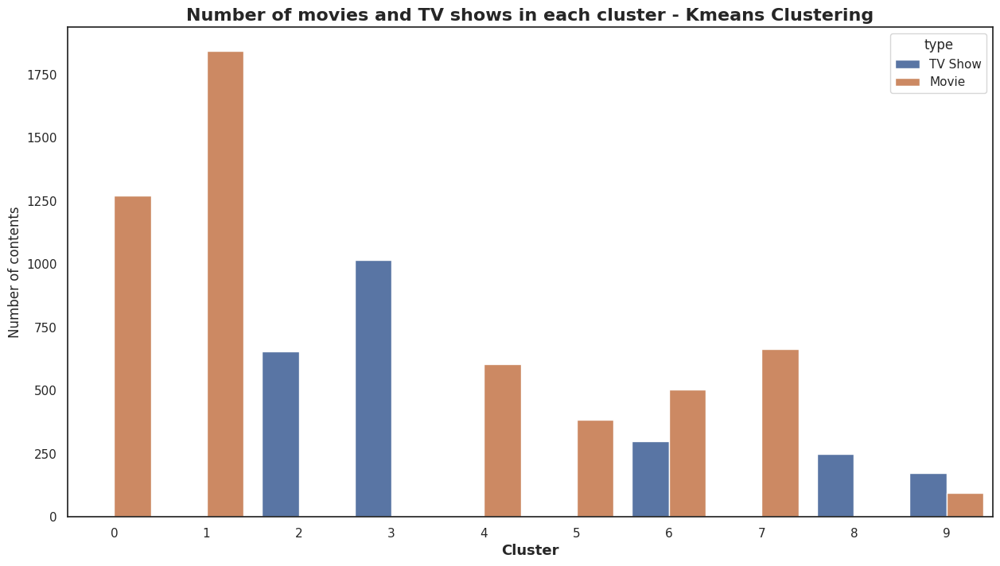

In [84]:
# Plotting the types of content for each cluster
plt.figure(figsize=(15,8))
sns.countplot(x='kmeans_cluster',data=netflix, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering', fontsize=16, fontweight='bold')
plt.xlabel('Cluster', fontsize=13, fontweight='bold')
plt.ylabel('Number of contents')
plt.show();

Only clusters 6 and 9 have both kinds of contents available. Otherwise the other eight clusters look to be purely TV Show clusters or Movie clusters.

In [85]:
# Function to plot the wordclouds
def worldcloud(cluster_type, cluster_number, column_name):

  netflix_df_wordcloud = netflix[[cluster_type, column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud[cluster_type]==cluster_number]
  
  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.figure(figsize = (8,6))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show();

cluster 0


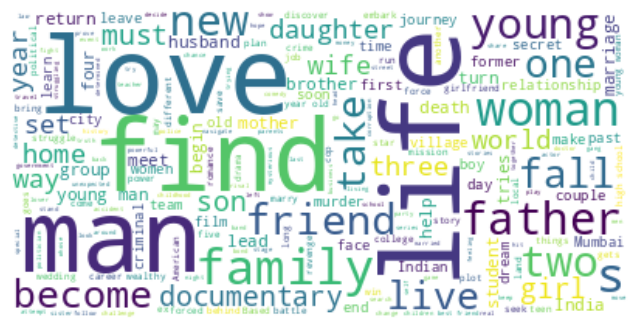

cluster 1


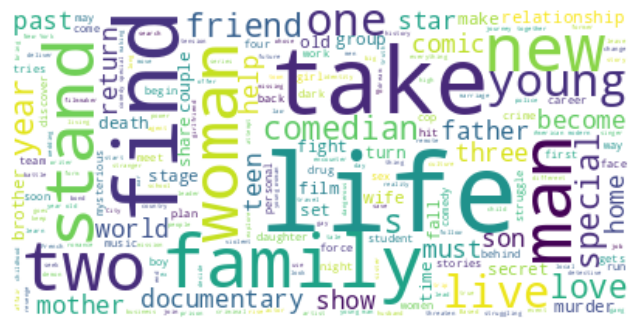

cluster 2


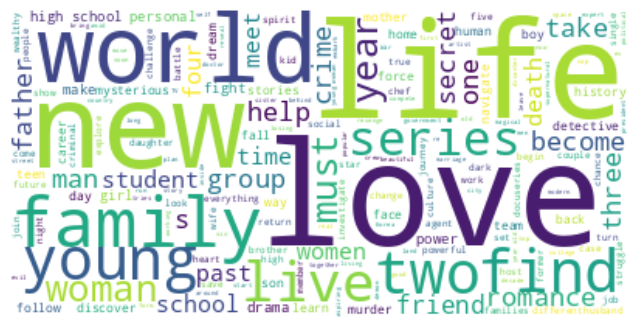

cluster 3


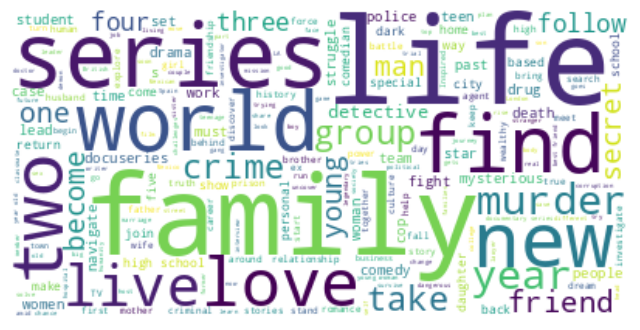

cluster 4


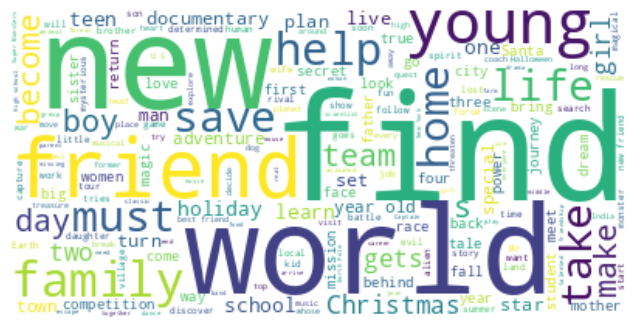

cluster 5


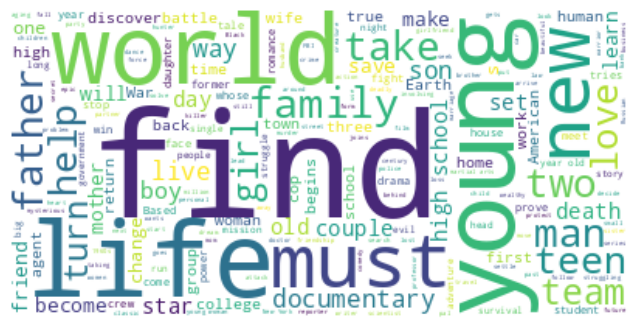

cluster 6


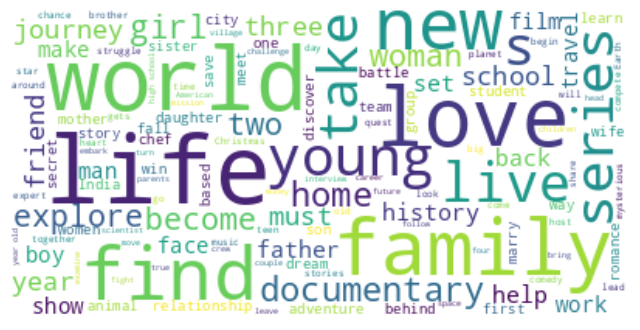

cluster 7


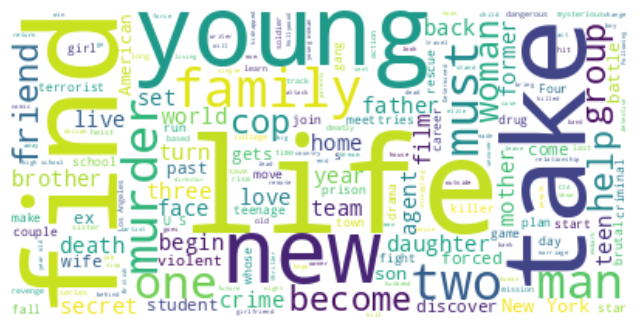

cluster 8


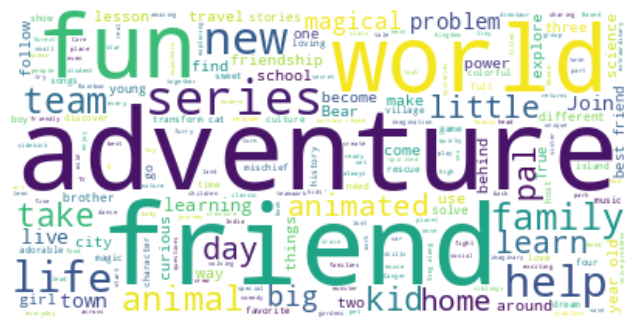

cluster 9


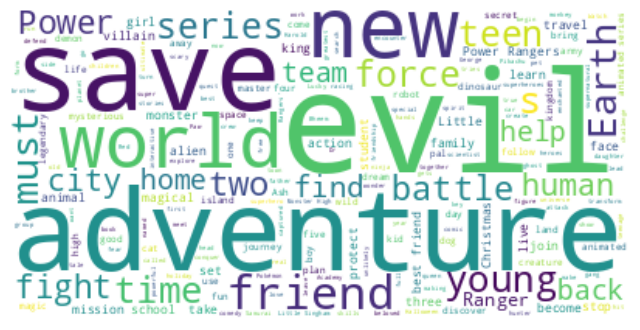

In [86]:
# Printing the wordclouds for descriptions of each cluster
for i in range(10):
  print(f'cluster {i}')
  worldcloud('kmeans_cluster',i,'description')

cluster 0


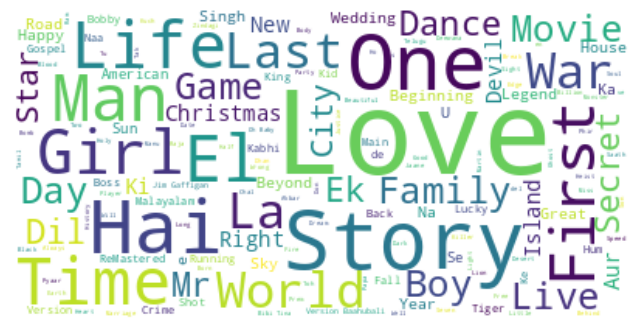

cluster 1


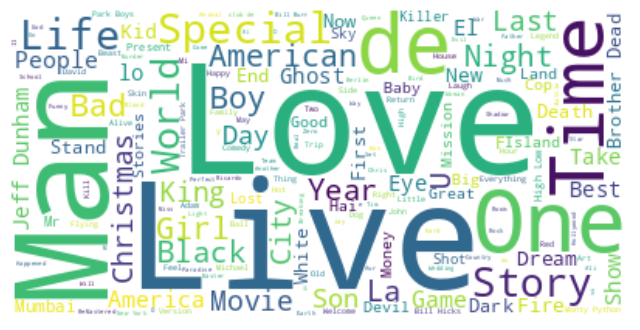

cluster 2


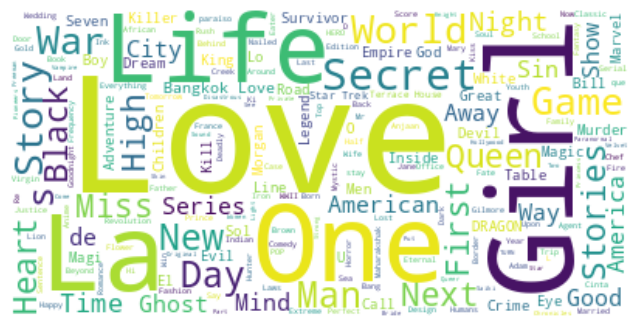

cluster 3


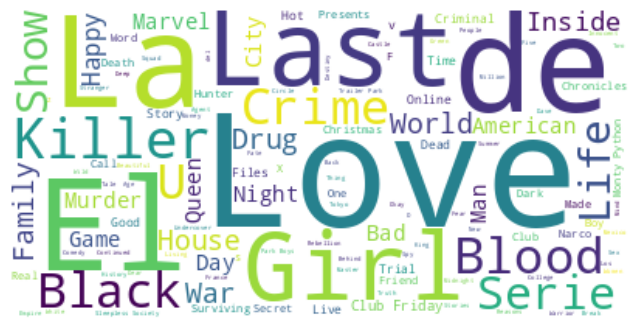

cluster 4


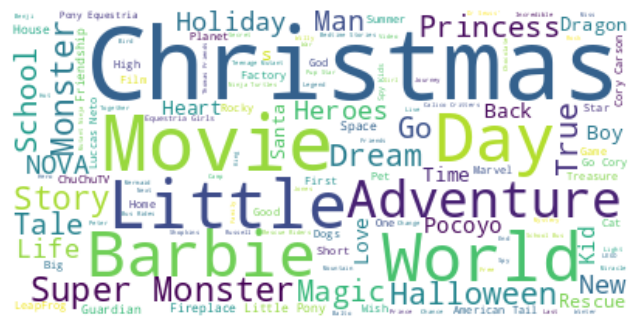

cluster 5


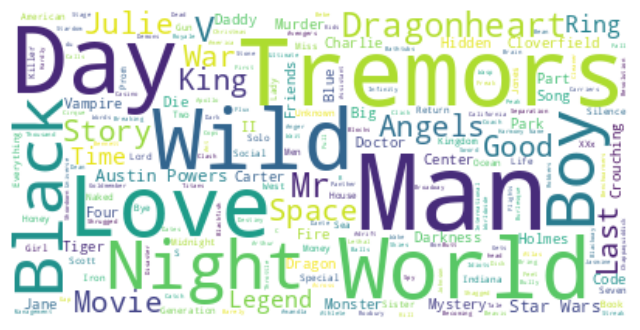

cluster 6


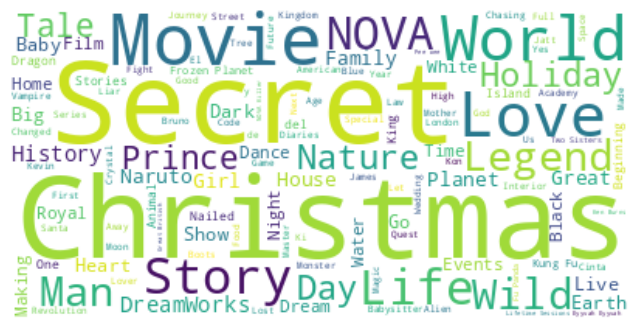

cluster 7


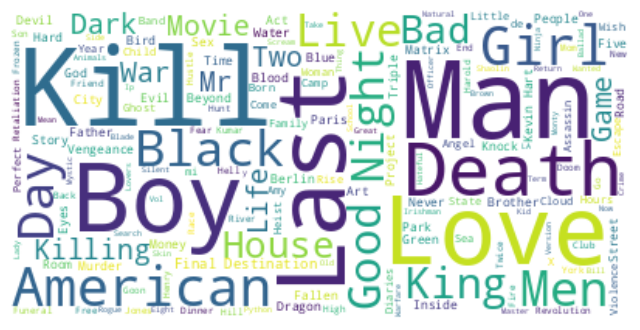

cluster 8


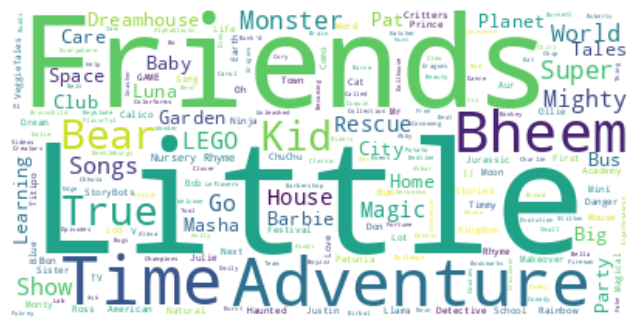

cluster 9


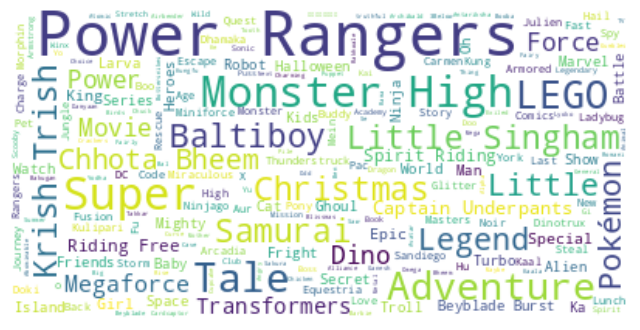

In [87]:
# Printing the wordclouds for titles of each cluster
for i in range(10):
  print(f'cluster {i}')
  worldcloud('kmeans_cluster',i,'title')

cluster 0


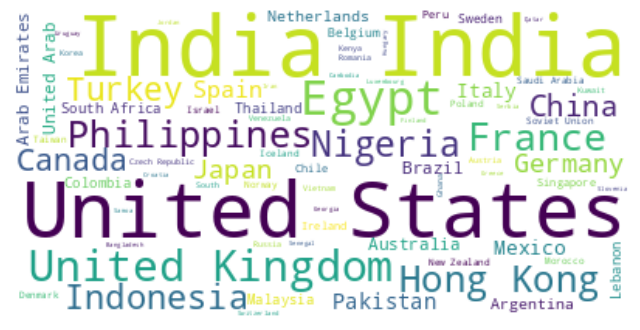

cluster 1


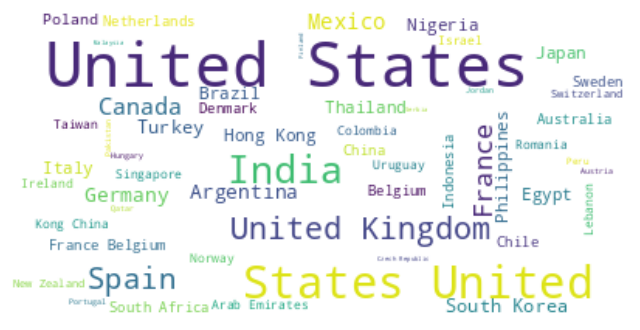

cluster 2


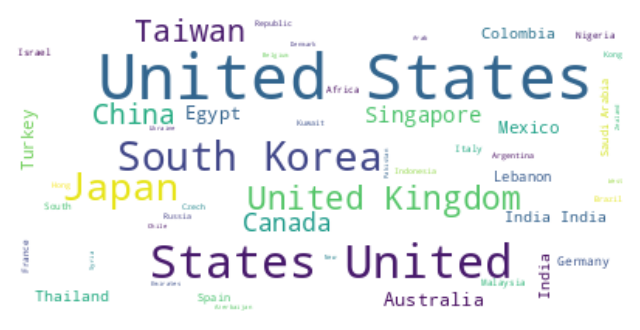

cluster 3


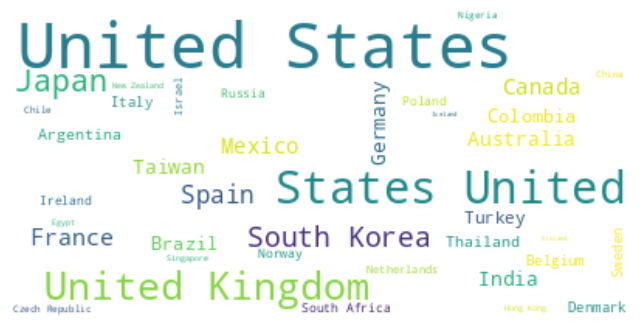

cluster 4


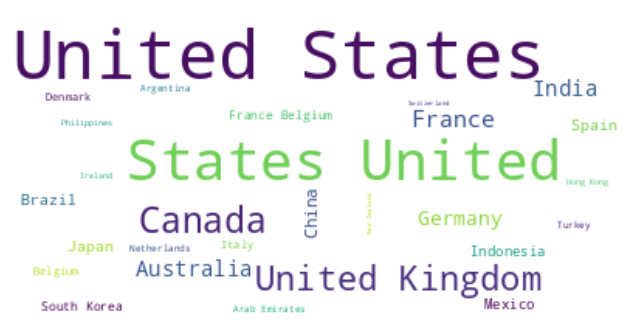

cluster 5


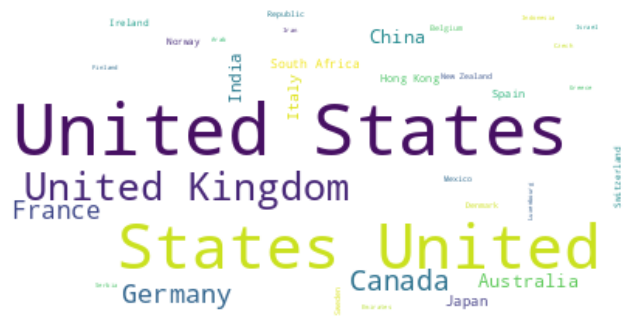

cluster 6


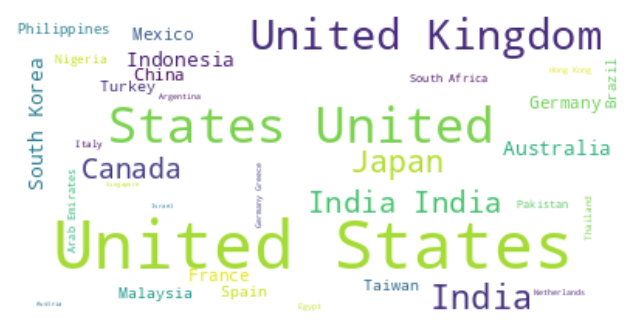

cluster 7


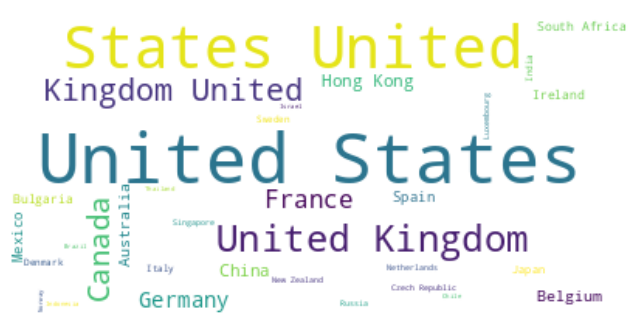

cluster 8


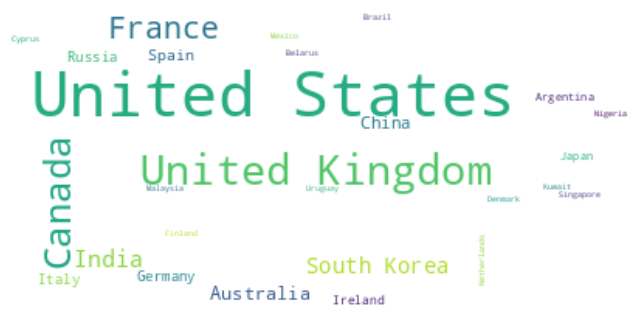

cluster 9


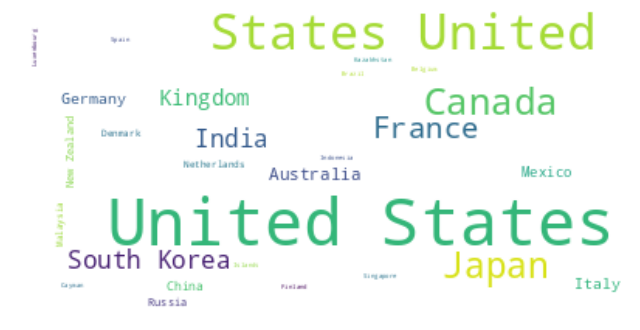

In [88]:
# Printing the wordclouds for country of each cluster
for i in range(10):
  print(f'cluster {i}')
  worldcloud('kmeans_cluster',i,'country')

cluster 0


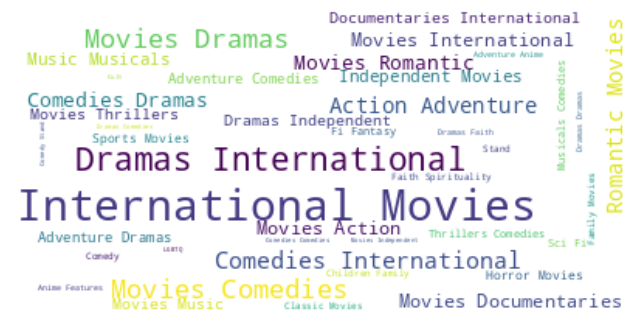

cluster 1


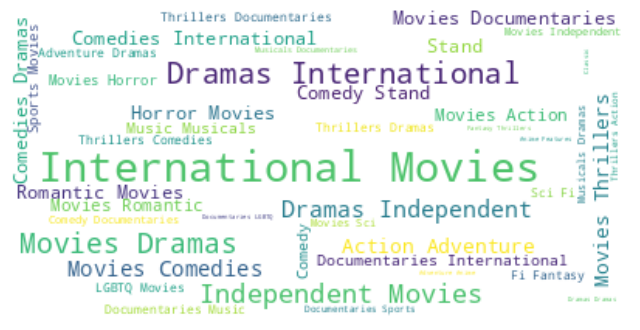

cluster 2


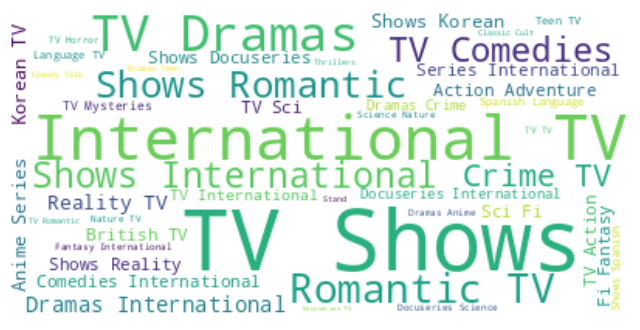

cluster 3


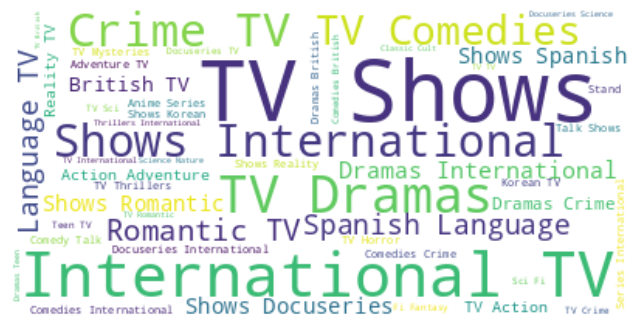

cluster 4


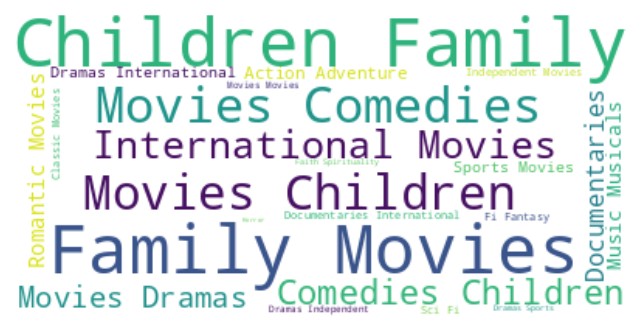

cluster 5


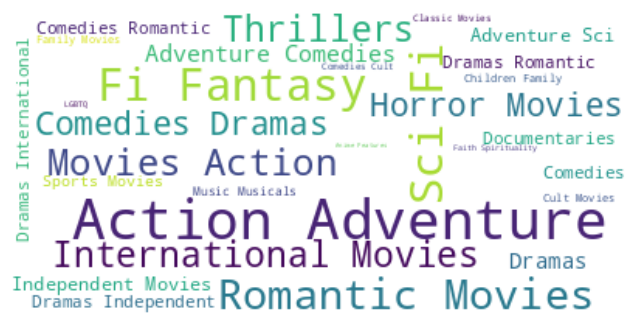

cluster 6


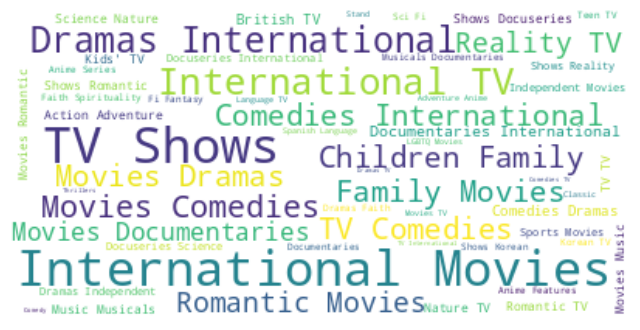

cluster 7


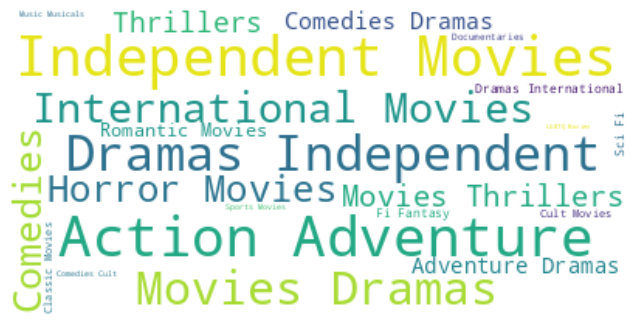

cluster 8


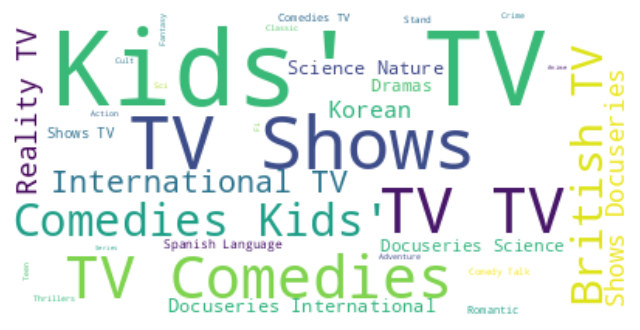

cluster 9


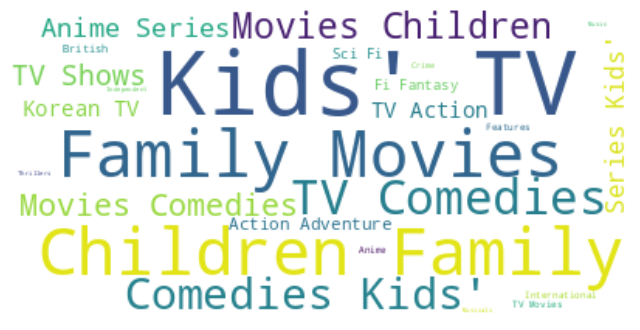

In [89]:
# Printing the wordclouds for genre of each cluster
for i in range(10):
  print(f'cluster {i}')
  worldcloud('kmeans_cluster',i,'listed_in')

#####**Observation:**

We created 10 clusters using K-Means algorithm. Below are some of the things we have noticed about the clusters from the samples, wordclouds and the other examination methods:

**Cluster 0:** TV-14 rated movie cluster from countries like India, US, UK, Germany, France, Indonesia, Nigeria and many more. Popular genre among this cluster includes International Movies, Romantic Movies, Comedies, Action Movies and Dramas.

**Cluster 1:** TV-MA rated movie cluster from countries like US, UK, India, Canada and France. Popular genre among this cluster includes Documentaries, Comedies, Dramas International, Thriller Movies, Drama Movies and many more.

**Cluster 2:** TV-14 rated TV show cluster from Asian countries Taiwan, China, Singapore, Japan, South Korea apart from the regulars UK and US. Romantic TV Shows, Korean TV, Internatonal TV, TV Comedies and Anime Series are som of the popular genres.

**Cluster 3:** TV-MA rated TV show cluster primarily from US, UK, South Korea, Japan, Brazil, Mexico, Spain and France. Popular genres include Crime TV, Spanish Language, Spanish Shows, International TV Shows, Language TV and TV Comedies.

**Cluster 4:** Movies of various kinds of ratings mainly from US, UK, Australia, Germany, India and France. Popular genres are Comedy Movies, Children Movies, Family Movies, Documentaries and Sports Movies.

**Cluster 5:** PG-13 rated movies mainly from US and UK. Very few other countries appear. Genres from the cluster are Action, Adventure, Sci-Fi, Fiction Fantasy and Horror Movies.

**Cluster 6:** TV-PG rated cluster of both movies and TV Shows from US, UK, India, Japan, Canada, Australia and Indonesia. Popular genres include International TV, International Movies, Children Movies and Reality TV.

**Cluster 7:** R rated movies from US, UK, Canada, Germany and France. A lot of Independent Movies, Horror Movies, Thriller Movies and Action Adventure feature in the cluster.

**Cluster 8:** TV-G and TV-Y rated TV Shows from US, UK, South Korea, Canada and India. Popular genres from the cluster are Kids TV, Comedies Kids, British TV, Reality TV and Docuseries.

**Cluster 9:** TV-Y7 rated TV shows and movies from US, Japan, UK, South Korea and Canada. The top genres are Family Movies, Kids TV, Kids Movies and Comedies.

#### ML Model - 2 - **Implementing Hierarchical Clustering**

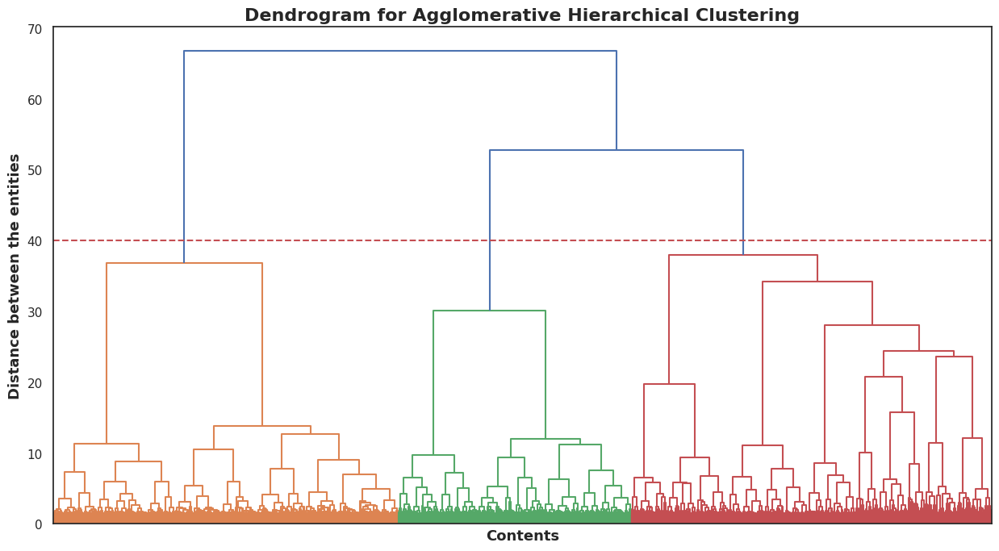

In [90]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(15,8))  
dendogram = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram for Agglomerative Hierarchical Clustering', fontsize = 16, fontweight = 'bold')
plt.xlabel('Contents', fontsize = 13, fontweight = 'bold')
plt.ylabel('Distance between the entities', fontsize = 13, fontweight = 'bold')
plt.axhline(y=40, color='r', linestyle='--')
plt.xticks([])
plt.show();

As per the dendogram we have decided to go ahead with three clusters, with the distance between the entities being 40.

In [91]:
# Agglomerative Hierarchical Clustering Algorithm Implementation
hierarchical = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
y_predict = hierarchical.fit_predict(X)

In [92]:
# Assigning the cluster values to the dataset
netflix['hierarchical_cluster'] = y_predict

In [93]:
# Sampling data from each cluster
for i in range(3):
  sample_df = netflix[netflix.hierarchical_cluster==i]
  print()
  print('=============================================')
  print(f'Sample from cluser {i}')
  print()
  sample_df.sample(10)


Sample from cluser 0



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster,hierarchical_cluster
4963,s4964,Movie,Prescription Thugs,"Chris Bell, Josh Alexander, Greg Young",Chris Bell,United States,2016-04-15,2015,NR,86 min,Documentaries,A documentarian uses his own family's experien...,4.00,4.00,2016.00,15.00,15-04 00:00:00,4,0
1749,s1750,Movie,Diary of a Chambermaid,Benoît Jacquot,"Léa Seydoux, Vincent Lindon, Clotilde Mollet, ...","France, Belgium",2016-12-03,2015,NR,96 min,"Dramas, International Movies",An attractive young woman goes to work as a ch...,12.00,5.00,2016.00,3.00,03-12 00:00:00,4,0
6776,s6777,Movie,The Prince & Me,Martha Coolidge,"Julia Stiles, Luke Mably, Ben Miller, Miranda ...","United States, Czech Republic",2020-10-01,2004,PG,111 min,"Comedies, Romantic Movies",A hardworking Wisconsin college student falls ...,10.00,3.00,2020.00,1.00,01-10 00:00:00,4,0
2739,s2740,TV Show,Highway to Heaven,,"Michael Landon, Victor French",United States,2016-11-01,1988,TV-PG,5 Seasons,TV Dramas,"Under God's direction, angel Jonathan and ex-c...",11.00,1.00,2016.00,1.00,01-11 00:00:00,6,0
6139,s6140,Movie,The Blackcoat's Daughter,Osgood Perkins,"Emma Roberts, Kiernan Shipka, Lucy Boynton, La...","Canada, United States",2019-05-18,2015,R,95 min,"Horror Movies, Independent Movies, Thrillers",When their parents fail to pick them up for wi...,5.00,5.00,2019.00,18.00,18-05 00:00:00,7,0
6624,s6625,Movie,The Lovers,Azazel Jacobs,"Aidan Gillen, Melora Walters, Tyler Ross, Jess...",United States,2019-11-05,2017,R,98 min,"Comedies, Dramas, Independent Movies","On the verge of divorce, a middle-aged couple,...",11.00,1.00,2019.00,5.00,05-11 00:00:00,7,0
4406,s4407,Movie,Naruto Shippûden the Movie: The Will of Fire,Masahiko Murata,"Junko Takeuchi, Kazuhiko Inoue, Chie Nakamura,...",Japan,2017-09-01,2009,TV-PG,96 min,"Action & Adventure, Anime Features, Internatio...",When four out of five ninja villages are destr...,9.00,4.00,2017.00,1.00,01-09 00:00:00,6,0
5422,s5423,Movie,Scales: Mermaids Are Real,Kevan Peterson,"Emmy Perry, Morgan Fairchild, Elisabeth Röhm, ...",United States,2020-01-23,2017,PG,93 min,Children & Family Movies,A seemingly ordinary girl learns she will turn...,1.00,3.00,2020.00,23.00,23-01 00:00:00,4,0
7381,s7382,TV Show,V.R. Troopers,,"Michael Sorich, Gardner Baldwin, Mike Reynolds...",United States,2016-01-01,1995,TV-G,2 Seasons,Kids' TV,Three friends who study martial arts find them...,1.00,4.00,2016.00,1.00,01-01 00:00:00,8,0
2666,s2667,Movie,He Named Me Malala,Davis Guggenheim,Malala Yousafzai,"United States, United Arab Emirates",2018-06-01,2015,PG-13,89 min,Documentaries,This documentary tells the story of a teenage ...,6.00,4.00,2018.00,1.00,01-06 00:00:00,5,0



Sample from cluser 1



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster,hierarchical_cluster
3132,s3133,Movie,Jefe,Sergio Barrejón,"Luis Callejo, Juana Acosta, Carlo D'Ursi, Jose...","Spain, Portugal",2018-10-26,2018,TV-MA,90 min,"Comedies, Dramas, International Movies","A rude, self-centered businessman seems to be ...",10.00,4.00,2018.00,26.00,26-10 00:00:00,1,1
1249,s1250,TV Show,Caught on Camera,,Nick Wallis,United Kingdom,2016-08-15,2015,TV-MA,3 Seasons,"British TV Shows, Crime TV Shows, Docuseries","Nick Wallis presents crimes caught on CCTV, ce...",8.00,0.00,2016.00,15.00,15-08 00:00:00,3,1
5065,s5066,Movie,Ragini MMS 2,Bhushan Patel,"Sunny Leone, Saahil Prem, Parvin Dabas, Sandhy...",India,2019-05-31,2014,TV-MA,113 min,"Horror Movies, International Movies",The horror continues when Ragini's video goes ...,5.00,4.00,2019.00,31.00,31-05 00:00:00,1,1
5094,s5095,Movie,Rampage: President Down,Uwe Boll,"Brendan Fletcher, Steve Baran, Ryan McDonell, ...",Canada,2017-01-05,2016,TV-MA,100 min,"Action & Adventure, International Movies","Lone-wolf vigilante Bill Williamson is back, t...",1.00,3.00,2017.00,5.00,05-01 00:00:00,1,1
4280,s4281,Movie,Munafik 2,Syamsul Yusof,"Syamsul Yusof, Maya Karin, Nasir Bilal Khan, R...",Malaysia,2019-05-01,2018,TV-MA,104 min,"Horror Movies, International Movies","Haunted by terrifying visions, a Muslim healer...",5.00,2.00,2019.00,1.00,01-05 00:00:00,1,1
5956,s5957,TV Show,Taco Chronicles,,,United States,2020-09-15,2020,TV-MA,2 Seasons,"Docuseries, International TV Shows, Reality TV",Many of the most popular taco styles have long...,9.00,1.00,2020.00,15.00,15-09 00:00:00,3,1
1910,s1911,TV Show,Eastsiders,,"Kit Williamson, Van Hansis, Constance Wu, Matt...",United States,2019-12-01,2018,TV-MA,4 Seasons,"TV Comedies, TV Dramas",Cal turns to his friends for help through a hi...,12.00,6.00,2019.00,1.00,01-12 00:00:00,3,1
39,s40,Movie,"¡Ay, mi madre!",Frank Ariza,"Estefanía de los Santos, Secun de la Rosa, Ter...",Spain,2019-07-19,2019,TV-MA,81 min,"Comedies, International Movies","When her estranged mother suddenly dies, a wom...",7.00,4.00,2019.00,19.00,19-07 00:00:00,1,1
5114,s5115,Movie,Ready to Mingle,Luis Javier Henaine,"Cassandra Ciangherotti, Gabriela de la Garza, ...",Mexico,2019-10-02,2019,TV-MA,98 min,"Comedies, International Movies, Romantic Movies",After the man she thought she'd marry breaks u...,10.00,2.00,2019.00,2.00,02-10 00:00:00,1,1
2083,s2084,TV Show,F is for Family,,"Bill Burr, Laura Dern, Justin Long, Debi Derry...","United States, France, Canada",2020-06-12,2020,TV-MA,4 Seasons,TV Comedies,"Follow the Murphy family back to the 1970s, wh...",6.00,4.00,2020.00,12.00,12-06 00:00:00,3,1



Sample from cluser 2



,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added,day_of_week_added,year_added,day_of_month_added,date_month_added,kmeans_cluster,hierarchical_cluster
7672,s7673,TV Show,Wormwood,,"Peter Sarsgaard, Molly Parker, Christian Camar...",United States,2017-12-15,2017,TV-14,1 Season,"Crime TV Shows, Docuseries","In this genre-bending tale, Errol Morris explo...",12.00,4.00,2017.00,15.00,15-12 00:00:00,2,2
4294,s4295,Movie,Music Teacher,Sarthak Dasgupta,"Manav Kaul, Amrita Bagchi, Divya Dutta, Neena ...",India,2019-04-19,2019,TV-14,102 min,"Dramas, Independent Movies, International Movies",A dejected small-town music teacher grapples w...,4.00,4.00,2019.00,19.00,19-04 00:00:00,0,2
139,s140,TV Show,72 Dangerous Animals: Latin America,,Bob Brisbane,"Australia, United States",2017-12-22,2017,TV-14,1 Season,"Docuseries, International TV Shows, Science & ...","Powerful cats, indestructible arachnids and fl...",12.00,4.00,2017.00,22.00,22-12 00:00:00,2,2
4715,s4716,Movie,Oye Lucky! Lucky Oye!,Dibakar Banerjee,"Abhay Deol, Paresh Rawal, Neetu Chandra, Archa...",India,2018-11-01,2008,TV-14,118 min,"Comedies, Dramas, International Movies","Starting as a petty thief, a man rises to beco...",11.00,3.00,2018.00,1.00,01-11 00:00:00,0,2
6514,s6515,Movie,The Jack King Affair,"Benjamin Cohen, Nicolas Cotto",,France,2018-01-02,2015,TV-14,52 min,"Documentaries, International Movies",This documentary explores a bold World War II ...,1.00,1.00,2018.00,2.00,02-01 00:00:00,0,2
6141,s6142,Movie,The Blazing Sun,Youssef Chahine,"Omar Sharif, Faten Hamama, Zaki Rostom, Farid ...",Egypt,2020-06-18,1954,TV-14,116 min,"Classic Movies, Dramas, International Movies",Competition between sugar cane producers turns...,6.00,3.00,2020.00,18.00,18-06 00:00:00,0,2
878,s879,Movie,Beyond the Clouds,Majid Majidi,"Ishaan Khattar, Malavika Mohanan, Goutam Ghose...","India, Iran",2018-08-10,2018,TV-14,120 min,"Dramas, Independent Movies, International Movies",A youthful drug dealer in Mumbai must change h...,8.00,4.00,2018.00,10.00,10-08 00:00:00,0,2
671,s672,Movie,Baby Mamas,Stephanie Zwane,"Salamina Mosese, Kay Smith, Thembisa Mdoda, Di...",South Africa,2020-03-13,2018,TV-14,98 min,"Comedies, Dramas, International Movies","From surprise news to relationship blues, four...",3.00,4.00,2020.00,13.00,13-03 00:00:00,0,2
2128,s2129,TV Show,Fate/stay night: Unlimited Blade Works,,"Noriaki Sugiyama, Kana Ueda, Ayako Kawasumi, J...",Japan,2018-12-20,2015,TV-14,2 Seasons,"Anime Series, International TV Shows",High school students Rin and Shiro pair up as ...,12.00,3.00,2018.00,20.00,20-12 00:00:00,2,2
259,s260,TV Show,A.D. Kingdom and Empire,,"Juan Pablo Di Pace, Adam Levy, Chipo Chung, Ba...",United States,2017-12-15,2015,TV-14,1 Season,TV Dramas,"In the wake of Jesus Christ's crucifixion, his...",12.00,4.00,2017.00,15.00,15-12 00:00:00,2,2


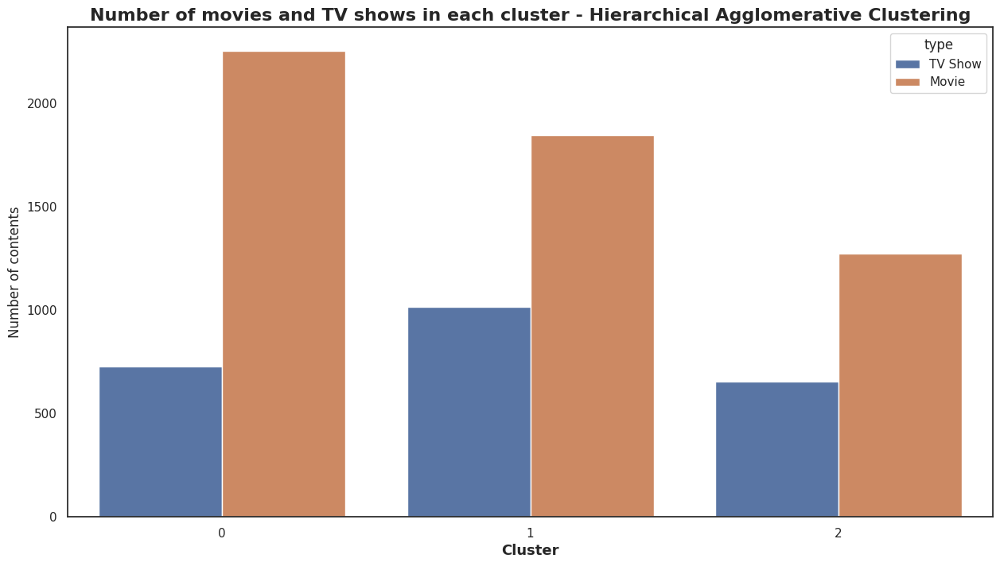

In [94]:
# Plotting the types of content for each cluster
plt.figure(figsize=(15,8))
sns.countplot(x='hierarchical_cluster',data=netflix, hue='type')
plt.title('Number of movies and TV shows in each cluster - Hierarchical Agglomerative Clustering', fontsize=16, fontweight='bold')
plt.xlabel('Cluster', fontsize=13, fontweight='bold')
plt.ylabel('Number of contents')
plt.show();

cluster 0


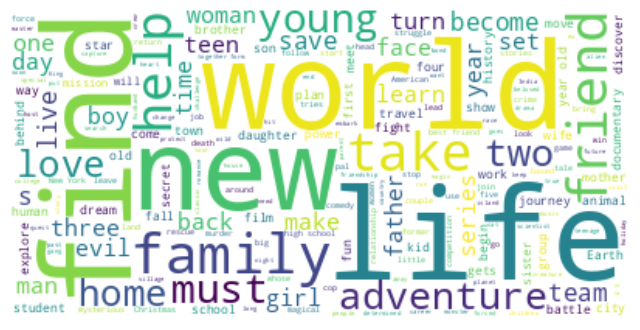

cluster 1


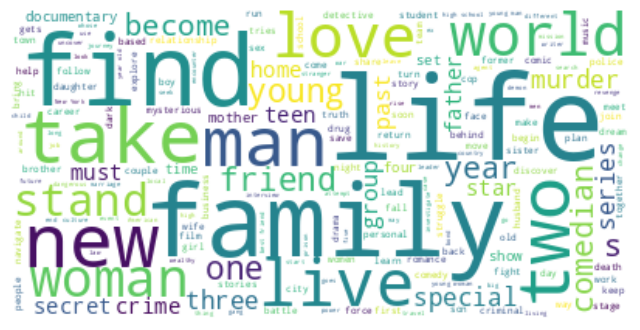

cluster 2


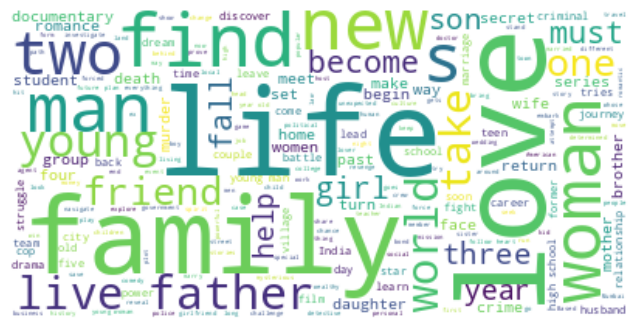

In [95]:
# Printing the wordclouds for descriptions of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'description')

cluster 0


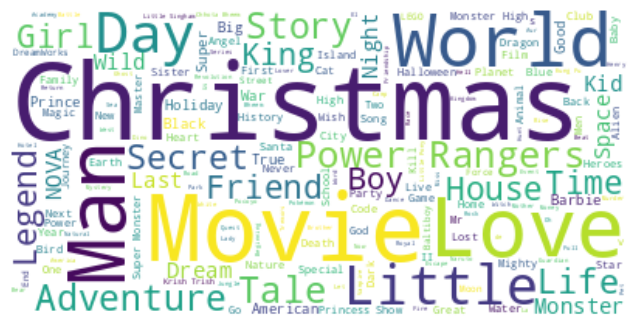

cluster 1


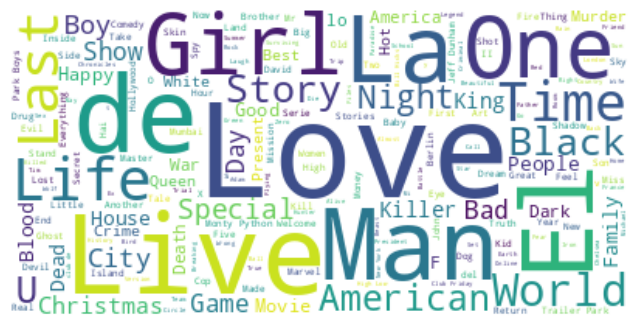

cluster 2


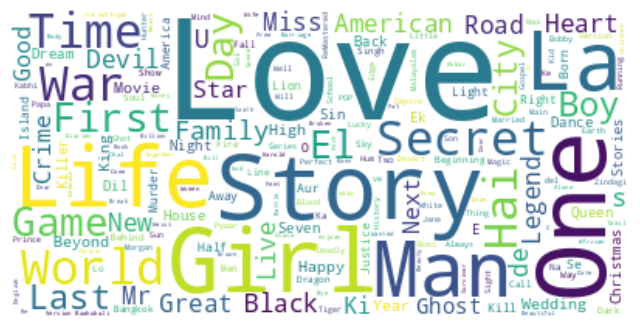

In [96]:
# Printing the wordclouds for title of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'title')

cluster 0


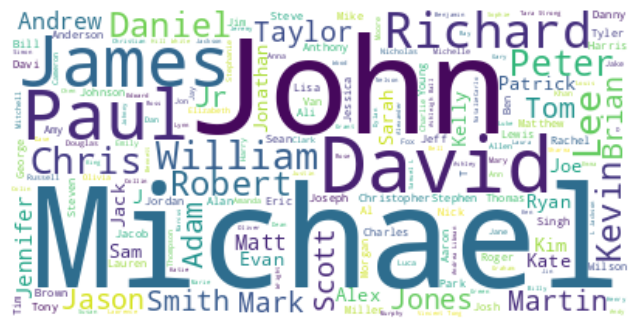

cluster 1


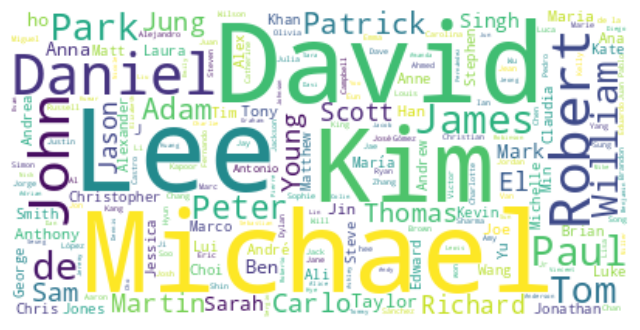

cluster 2


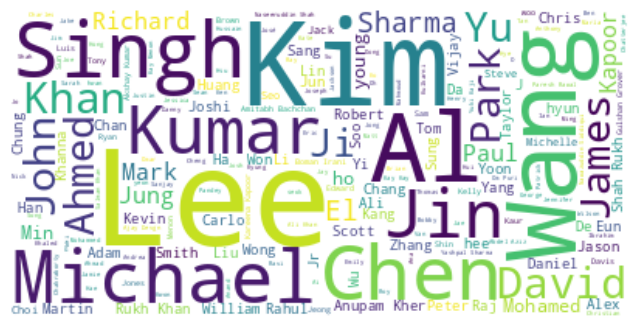

In [97]:
# Printing the wordclouds for cast of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'cast')

cluster 0


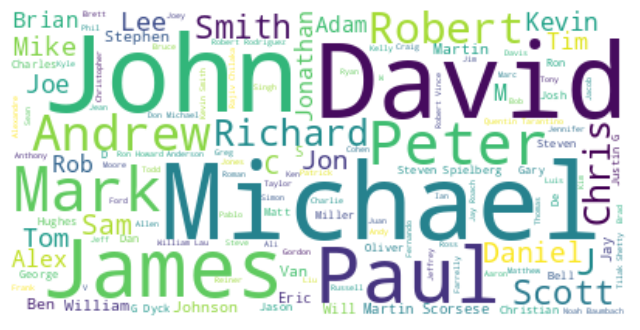

cluster 1


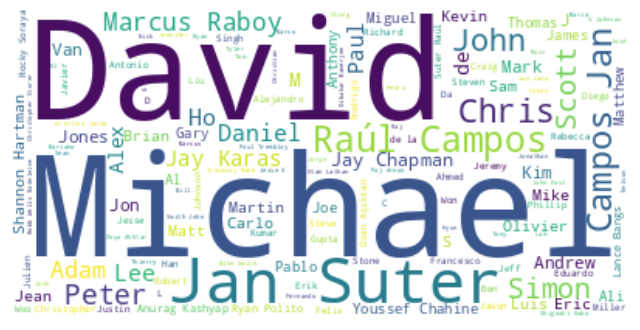

cluster 2


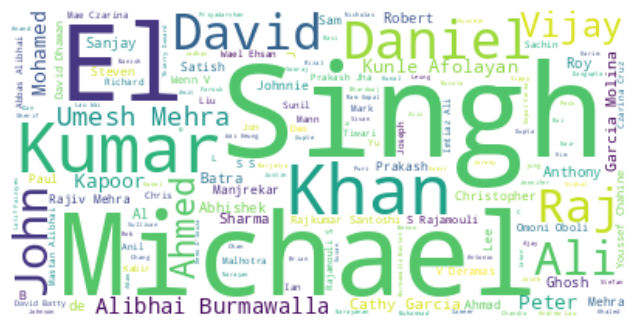

In [98]:
# Printing the wordclouds for director of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'director')

cluster 0


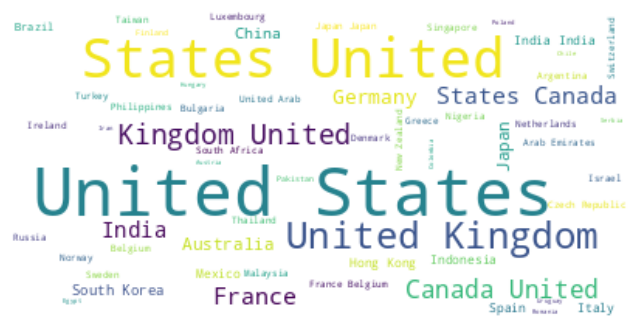

cluster 1


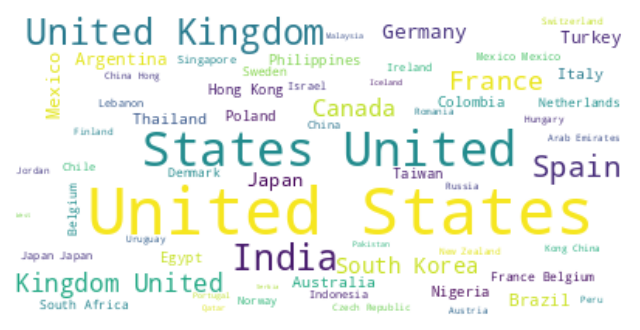

cluster 2


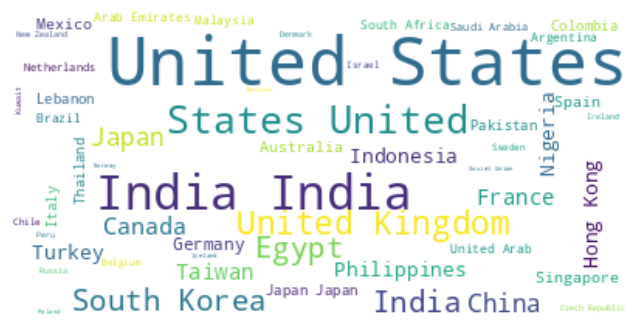

In [99]:
# Printing the wordclouds for country of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'country')

cluster 0


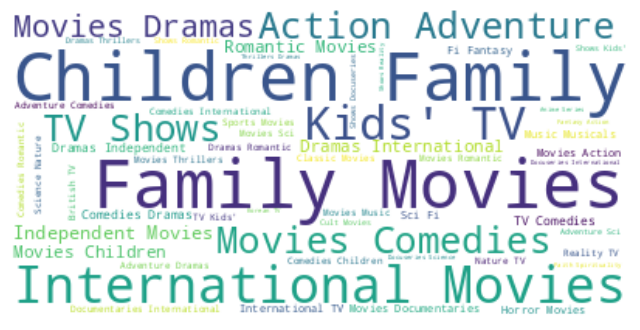

cluster 1


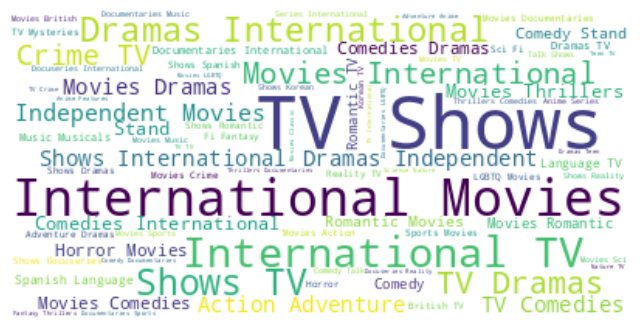

cluster 2


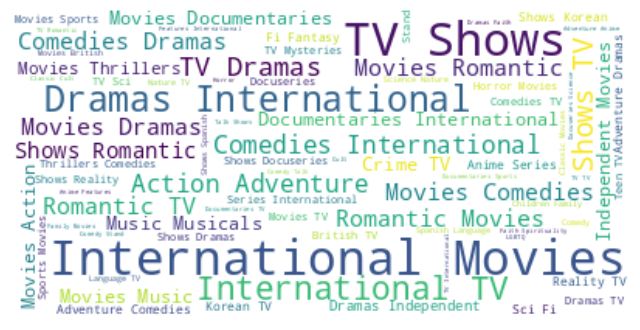

In [100]:
# Printing the wordclouds for genre of each cluster
for i in range(3):
  print(f'cluster {i}')
  worldcloud('hierarchical_cluster',i,'listed_in')

In [101]:
# Checking the distribution of TV ratings
netflix[netflix['hierarchical_cluster']==0]['rating'].value_counts(normalize=True)

TV-PG      0.27
R          0.22
PG-13      0.13
TV-Y       0.09
TV-Y7      0.09
PG         0.08
TV-G       0.07
NR         0.03
G          0.01
TV-Y7-FV   0.00
UR         0.00
NC-17      0.00
Name: rating, dtype: float64

In [102]:
# Checking the distribution of TV ratings
netflix[netflix['hierarchical_cluster']==1]['rating'].value_counts(normalize=True)

TV-MA   1.00
Name: rating, dtype: float64

In [103]:
# Checking the distribution of TV ratings
netflix[netflix['hierarchical_cluster']==2]['rating'].value_counts(normalize=True)

TV-14   1.00
Name: rating, dtype: float64

#####**Observation:**

We have obtained three clusters using Agglomerative Hierarchical Clustering Method. The description of those three clusters are:

**Cluster 0:** Contains TV shows and movies of all kinds of ratings except for TV-14 and TV-MA. US, UK, Canada and France seem to be the most popular countries whereas Family Movies, Kids TV, Comedies and Action Adventure are some of the popular genres.

**Cluster 1:** Contains TV shows and movies of TV-MA rating. US, UK, India, France, Canada and Spain are the popular countries. Genres that are popular in this cluster are TV Dramas, Crime TV, International Movies and International Dramas.

**Cluster 2:** Contains TV shows and movies of TV-14 rating. India, US, Phillipines, South Korea, China and Egypt are the popular countries. International Movies, International TV, Comedies, Musicals and Romantic Shows are the popular genres.

#### Final Model:

Given the nature of the clusters formed by Hierarchichal Clustering, there aren't much seperation done based on some important features. 

The three clusters are just divided based as follows: the contents with the two most dominant TV ratings are two of the three clusters and the rest of the content is clubbed in the final cluster.

And so, if we were to decide which one to choose as the final model, we will perhaps go ahead with the KMeans Clusters. However, this call also depends on the business domain and the requirements of the main stakeholders of the projects.

# **Conclusion**


**Conclusions from EDA Process:**

There are more than double the amount of Movies than TV Shows on Netflix. Movies account for 69.05% whereas TV Shows account for 30.95% of the dataset.

If we look at the distribution of the dates when the contents were added, the second half of a year (the holiday period) is usually when they add the content and it is either on the 1st or the 15th or the 31st.

United States has the highest number of contents produced and it is three times in numbers when compared with the next best in line, India.

Countries generally focus a lot on movies, but there are exceptions. East Asian countries like Japan and South Korea produce more TV Shows than movies.

Whereas, a country like India could do a lot better in the TV Shows domain.

Netflix really took off since 2015, before which the rate at which newer contents were added were quite slow. Also, while movies are added in large numbers, their growth has stopped and the numbers went down for the first time while going from 2019 to 2020.

While in contrast, TV Shows have almost shown a steady growth and never saw any kind of drop in numbers, not even going in 2020.

January, December and October are the peak months. Whereas, February and May to September don't have much contents added, relatively. March has an abnormal behaviour when compared with the rest of the months.

Weekends have the lowest number of releases. However, Friday has the highest of all the days of the week. Movies again are larger in number than TV Shows and the trend is almost similar between the two on all the days.

Again, the content released graph has very little surprises for us. The focus has shifted a lot on releasing newer TV shows more than movies. So much has the focus shifted that for the first time ever, in 2020, the number of TV shows released surpassed the number of movie releases on Netflix. 

Contents suitable for all are very few in number whereas contents with restrictions like TV-MA (unsuitable for under 17), TV-14 (may be unsuitable for under 14) and TV-PG (unsuitable for young childern) are the three highest in numbers.

A lot of TV Shows (more than 1600) have only one season. Almost 400 have two and there is almost an exponential decrement in the number of TV Shows with even larger number of seasons.

A lot of the movies are between 60 to 150 mins long. But there are movies with more than 300+ minutes duration.

International TV Shows and International Movies are two of the most dominant genres. Others include Dramas, Comedies, Documentaries and Action & Adventure.

The top 10 TV shows directors on Netflix doesn't feature directors with more than 3 TV Shows on the streaming service.

Some of the biggest names of the industry like Steven Spielberg, Martin Scorsese and Jay Chapman feature in the list of top 10 movie directors on Netflix.

A lot of Asian, perhaps East Asian actors feature on the list of top 10 actors/actresses for TV Shows on Netflix.

The list of top 10 movies actors is full of A-listers from Bollywood, as expected given the number of movies from India on Netflix.

**Conclusions from Hypothesis Testing done:**

Given our very low p-value, we had to reject the null hypothesis that there is difference in the TV ratings for Netflix's original and non-original contents. There is significant evidence to reject our null hypothesis.

Since the p-value is very low, we will once again reject the null hypothesis that the duration of the Netflix Original movies and the other movies are not from two different distributions.

**Conclusions from clusters of our final chosen clustering model:**

We created 10 clusters using K-Means algorithm. Below are some of the things we have noticed about the clusters from the samples, wordclouds and the other examination methods:

**Cluster 0:** TV-14 rated movie cluster from countries like India, US, UK, Germany, France, Indonesia, Nigeria and many more. Popular genre among this cluster includes International Movies, Romantic Movies, Comedies, Action Movies and Dramas.

**Cluster 1:** TV-MA rated movie cluster from countries like US, UK, India, Canada and France. Popular genre among this cluster includes Documentaries, Comedies, Dramas International, Thriller Movies, Drama Movies and many more.

**Cluster 2:** TV-14 rated TV show cluster from Asian countries Taiwan, China, Singapore, Japan, South Korea apart from the regulars UK and US. Romantic TV Shows, Korean TV, Internatonal TV, TV Comedies and Anime Series are som of the popular genres.

**Cluster 3:** TV-MA rated TV show cluster primarily from US, UK, South Korea, Japan, Brazil, Mexico, Spain and France. Popular genres include Crime TV, Spanish Language, Spanish Shows, International TV Shows, Language TV and TV Comedies.

**Cluster 4:** Movies of various kinds of ratings mainly from US, UK, Australia, Germany, India and France. Popular genres are Comedy Movies, Children Movies, Family Movies, Documentaries and Sports Movies.

**Cluster 5:** PG-13 rated movies mainly from US and UK. Very few other countries appear. Genres from the cluster are Action, Adventure, Sci-Fi, Fiction Fantasy and Horror Movies.

**Cluster 6:** TV-PG rated cluster of both movies and TV Shows from US, UK, India, Japan, Canada, Australia and Indonesia. Popular genres include International TV, International Movies, Children Movies and Reality TV.

**Cluster 7:** R rated movies from US, UK, Canada, Germany and France. A lot of Independent Movies, Horror Movies, Thriller Movies and Action Adventure feature in the cluster.

**Cluster 8:** TV-G and TV-Y rated TV Shows from US, UK, South Korea, Canada and India. Popular genres from the cluster are Kids TV, Comedies Kids, British TV, Reality TV and Docuseries.

**Cluster 9:** TV-Y7 rated TV shows and movies from US, Japan, UK, South Korea and Canada. The top genres are Family Movies, Kids TV, Kids Movies and Comedies.